In [1]:
import numpy as np
import networkx as nx

In [2]:
# Settings for autoreloading

%load_ext autoreload
%autoreload 2

In [3]:
from random import seed

# Settings for riproducibility
SEED = 42
np.random.seed(SEED)
seed(SEED)

In [4]:
import os

# Important constants
CITY_NAME = 'Bangalore'
# GEOJSON_PATH = os.path.join('data', 'bristol_msoa.json')
# TRAVEL_TIMES_DATA_PATH = os.path.join('data', 'bristol-msoa-2020-1-OnlyWeekdays-HourlyAggregate.csv')

GEOJSON_PATH = '/content/data/bangalore_wards.json'
TRAVEL_TIMES_DATA_PATH = '/content/data/bangalore-wards-2019-3-OnlyWeekdays-HourlyAggregate.csv'

# 01 Networks Definition
In this section the temporal network defining the mean travel times during weekdays at different hours is built along with a spatial graph defining the city structure.

## 01.1 Spatial Network
A spatial network is built as an undirected graph where the node correspond to different blocks of the cities and the edges contain the distance between neighboring regions.

A `GeoJSON` file describing the coordinates of the polygons which delimit the zones in the city is imported as a `GeoDataFrame` and  exploited to build the spatial network that models the underlying city structure.

In [5]:
from utils.geodataframe import get_geodataframe

gdf = get_geodataframe(GEOJSON_PATH)

print(f'Geodataframe of {CITY_NAME}:')
gdf.head()

Geodataframe of Bangalore:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME
0,"MULTIPOLYGON (((77.59229 13.0972, 77.59094 13....",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru"
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya..."
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y..."
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay..."
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish..."


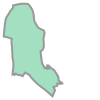

In [6]:
gdf.iloc[0]['geometry']

Centroids are computed for each area. They are subsequently used to calculate the distance among the areas and are used as reference points.

In [7]:
from utils.geodataframe import set_geodataframe_centroids

set_geodataframe_centroids(gdf)

In [8]:
print(f'Geodataframe of {CITY_NAME} after the centroid computation:')
gdf.head()

Geodataframe of Bangalore after the centroid computation:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME,centroid
0,"MULTIPOLYGON (((77.59229 13.0972, 77.59094 13....",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru",POINT (77.58042 13.12171)
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya...",POINT (77.56004 13.1028)
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y...",POINT (77.58393 13.09099)
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay...",POINT (77.66957 13.00606)
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish...",POINT (77.71546 13.01685)


In [9]:
sorted(gdf['MOVEMENT_ID'].astype("int32").unique())

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185

The spatial network is built from the `GeoDataFrame` and its statistics are illustrated.

In [10]:
from utils.spatial_network import get_spatial_network

spatial_network = get_spatial_network(gdf)

In [11]:
print(f'Number of nodes in the spatial network: {len(spatial_network.nodes())}')
print(f'Number of edges in the spatial network: {len(spatial_network.edges())}')
print(f'Spatial network density: {nx.density(spatial_network)}')

Number of nodes in the spatial network: 198
Number of edges in the spatial network: 582
Spatial network density: 0.029841562836486694


In [12]:
print(f'The spatial network is directed: {nx.is_directed(spatial_network)}')

The spatial network is directed: False


Finally, the spatial network is shown below over the city map.

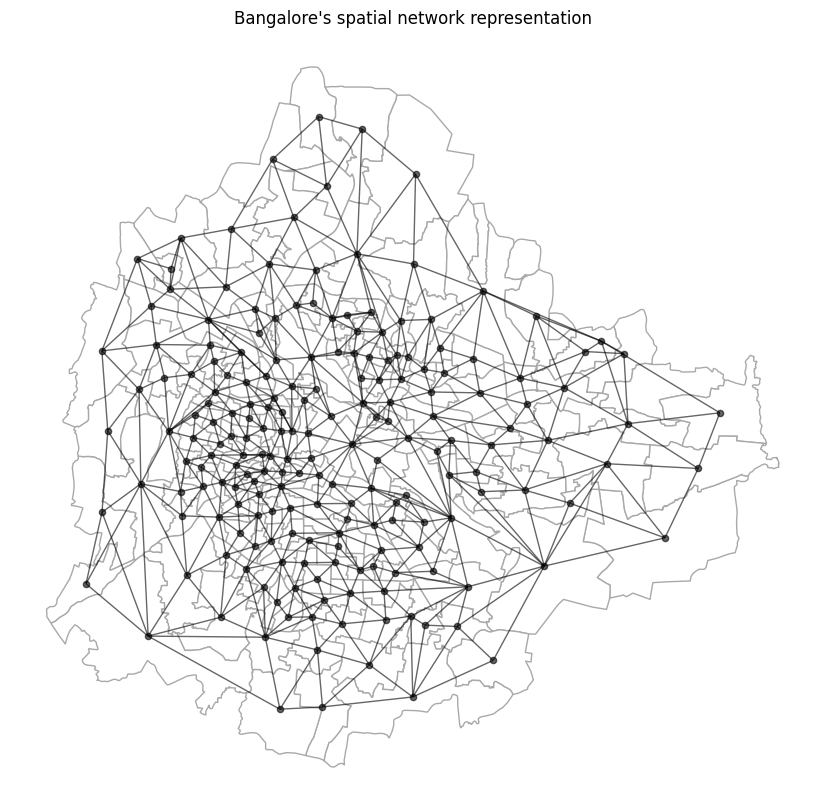

In [13]:
from utils.graphics import plot_spatial_network

plot_spatial_network(gdf, spatial_network, title=f"{CITY_NAME}'s spatial network representation")

# 01.2 Temporal Network
A temporal Network with dynamic weights on the edges is defined. The nodes correspond to different regions and are a subset of the ones
present in the spatial network, while the edges include the average travel time over the different considered hours of the day across the regions. The dynamicity of the temporal network is handled by building a dictionary that for each considered hour, contains the view of the temporal network at that specific hour.

A `pandas DataFrame` containing the mean travel times among regions is initially created from the `.csv` of the *Uber Movement* data of the city.

In [14]:
from utils.temporal_network import get_movement_dataframe

df = get_movement_dataframe(TRAVEL_TIMES_DATA_PATH)

print(f"{CITY_NAME}'s movement dataframe:")
df.head()

Bangalore's movement dataframe:


,sourceid,dstid,hod,mean_travel_time
0,55,111,8,2026.76
1,22,25,13,770.07
2,163,16,14,3151.78
3,162,26,14,3093.64
4,23,15,13,2835.28


The temporal network is built from the `DataFrame` and its statistics are illustrated.

In [15]:
np.sort(df['hod'].astype("int32").unique().T)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int32)

In [16]:
from utils.temporal_network import get_temporal_networks_from_pandas_edgelist

temporal_networks_dict = get_temporal_networks_from_pandas_edgelist(df, [0, 8, 13, 20])

In [17]:
draft = temporal_networks_dict.copy()
draft_sorted = sorted(list(draft.items()), key=lambda x: nx.density(x[1]))

for k,v in draft_sorted:
    if nx.density(v) > 0.8:
        print("list of temporal networks is sorted by density:", f'Temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())} density: {nx.density(v)}')

list of temporal networks is sorted by density: Temporal network at time 0: nodes: 198 edges: 32261 density: 0.82707788545352
list of temporal networks is sorted by density: Temporal network at time 8: nodes: 198 edges: 35772 density: 0.9170896785109983
list of temporal networks is sorted by density: Temporal network at time 20: nodes: 198 edges: 36131 density: 0.9262933907603959
list of temporal networks is sorted by density: Temporal network at time 13: nodes: 198 edges: 36497 density: 0.9356765625801159


In [18]:
for k, v in temporal_networks_dict.items():
   print(f'Temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())} density: {nx.density(v)}')

Temporal network at time 0: nodes: 198 edges: 32261 density: 0.82707788545352
Temporal network at time 8: nodes: 198 edges: 35772 density: 0.9170896785109983
Temporal network at time 13: nodes: 198 edges: 36497 density: 0.9356765625801159
Temporal network at time 20: nodes: 198 edges: 36131 density: 0.9262933907603959


In [19]:
for k, v in temporal_networks_dict.items():
    print(f'Temporal network at time {k} is directed: {nx.is_directed(v)}')

Temporal network at time 0 is directed: True
Temporal network at time 8 is directed: True
Temporal network at time 13 is directed: True
Temporal network at time 20 is directed: True


# 02 Analysis
Centrality and community detection algorithms are applied on both the spatial and temporal networks of the city in order to extract insights about the traffic flow.

## 02.1 Node centrality
Centrality metrics are examined to identify bottlenecks or peak traffic zones in the temporal network and core/peripheral zones in the spatial network, aiming to better understand the structural characteristics of urban traffic flow and human activity in the considered cities.

### 02.1.1 Node degree
In temporal graphs nodes with high weighted *in-degree* and *out-degree* are likely to correspond to areas of high traffic congestion. Specifically, high *in-degree* nodes indicate areas that are the destination of many travelers, while high *out-degree*
nodes indicate areas that are the origin of many travels.

#### In-degree
Firstly, the *in-degree* of the nodes in temporal network is computed and the results are illustrated.

In [20]:
from utils.metrics import get_nodes_in_degree_centrality

temporal_networks_in_degrees = {
    k: get_nodes_in_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

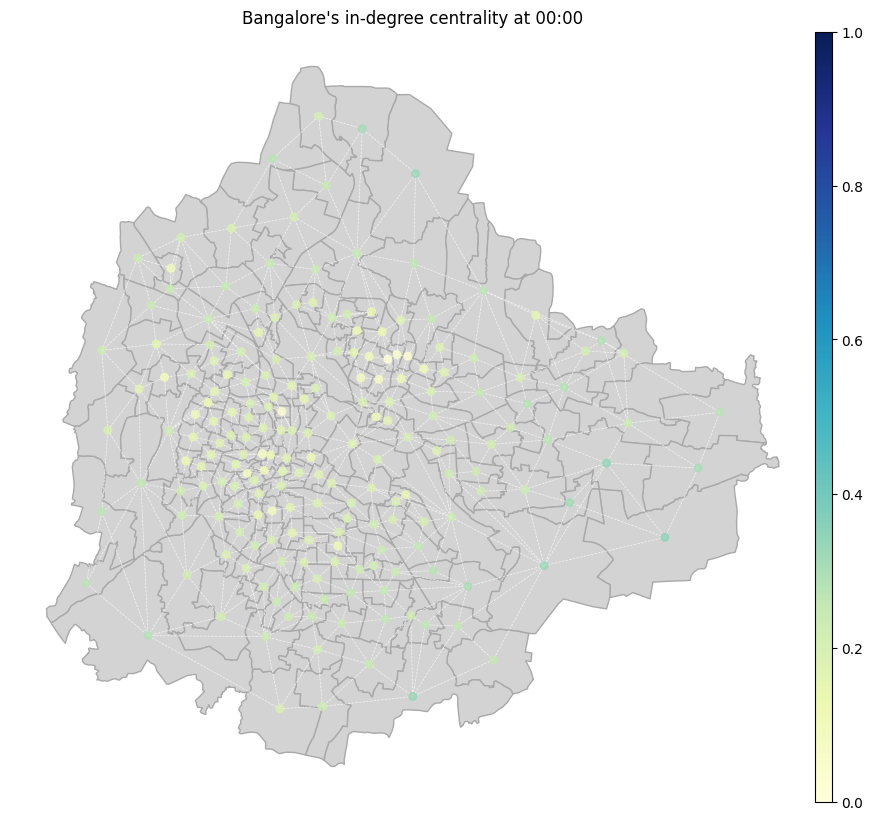

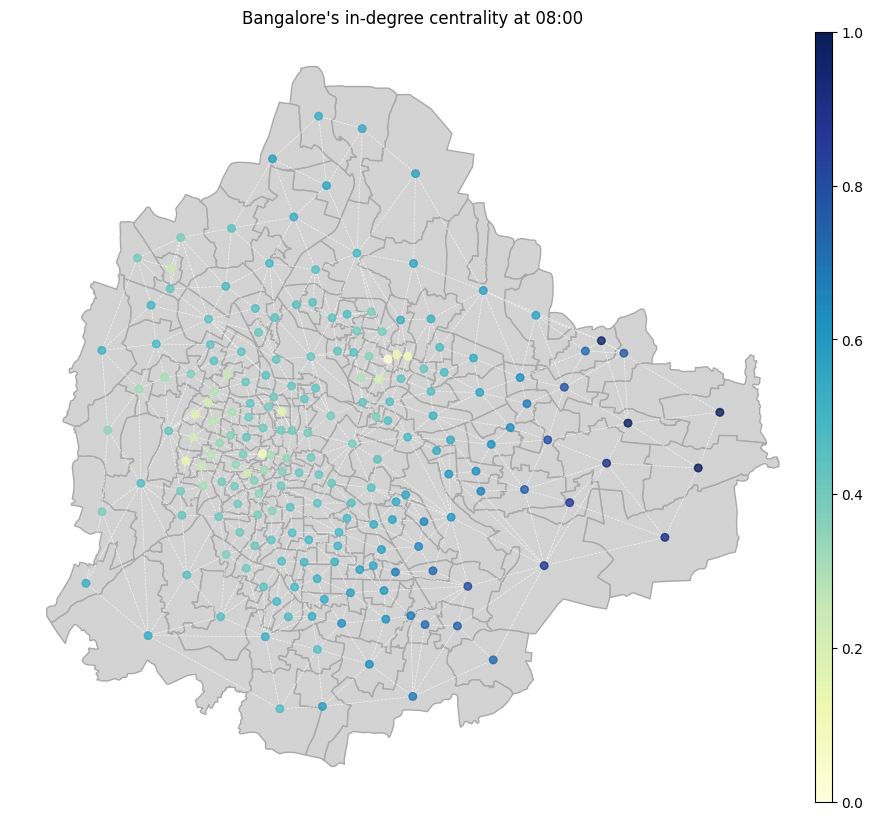

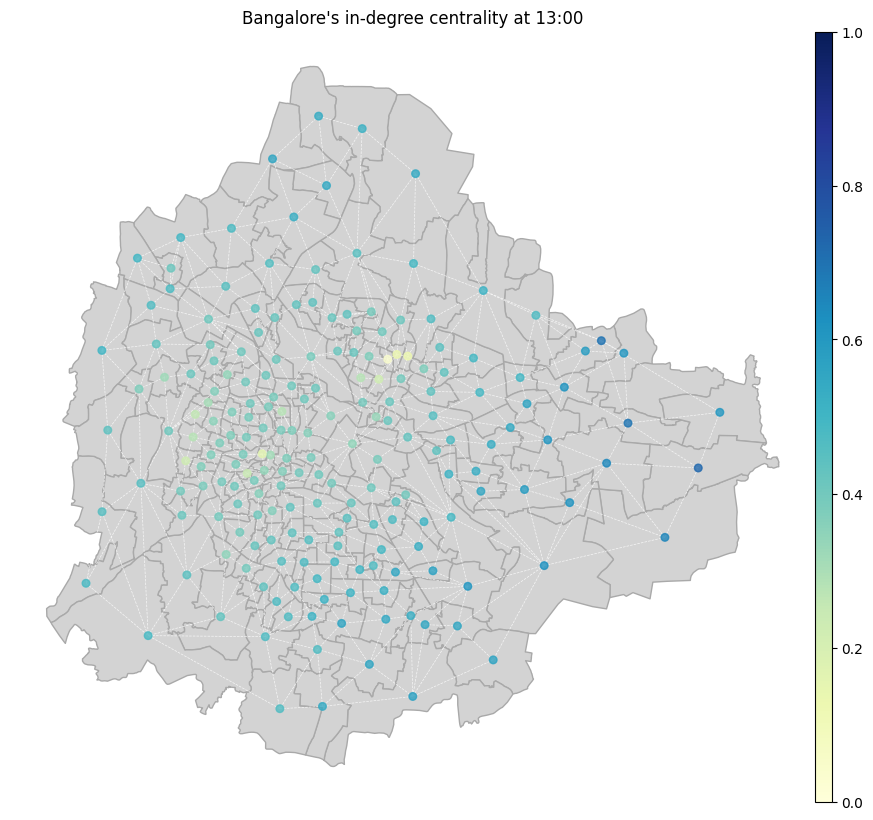

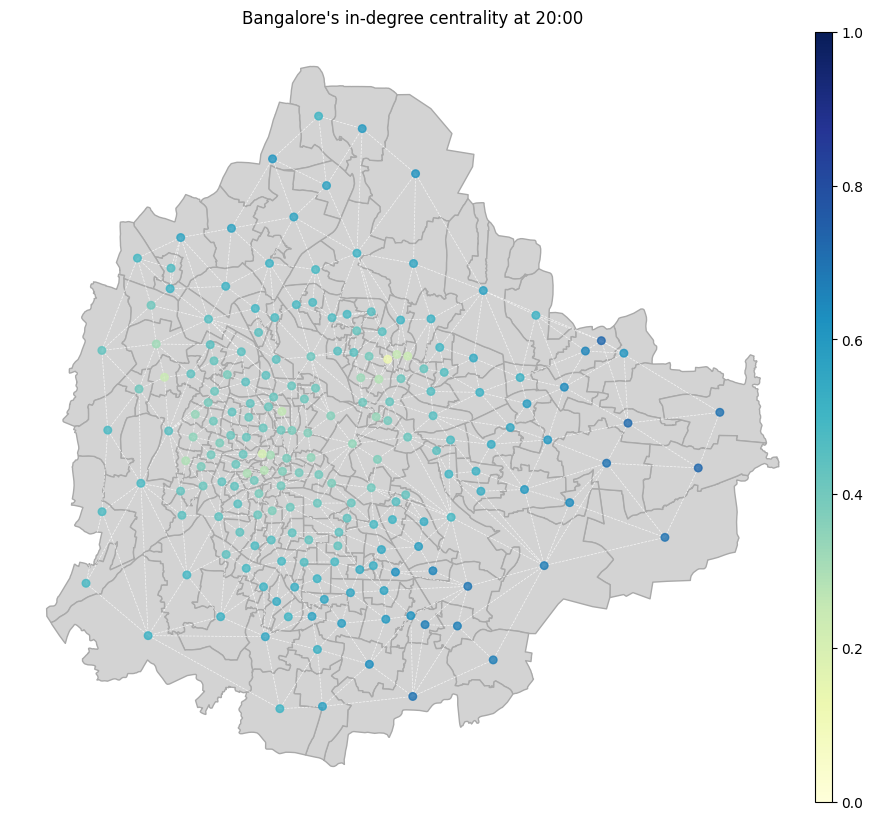

In [21]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_in_degrees, CITY_NAME, 'in-degree')

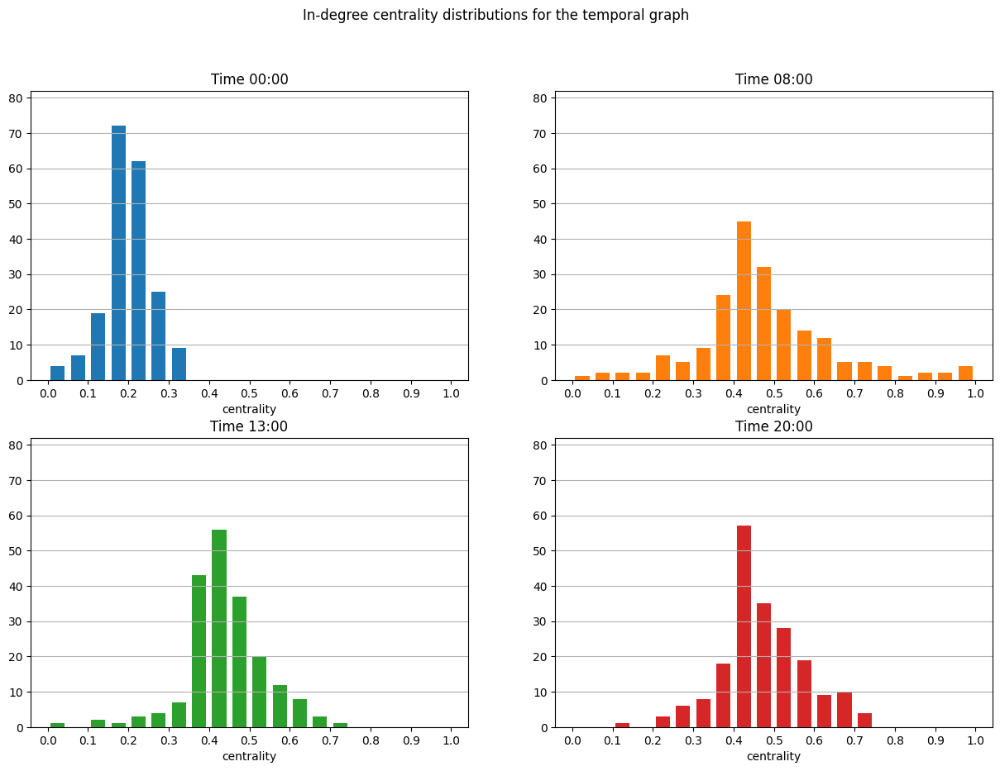

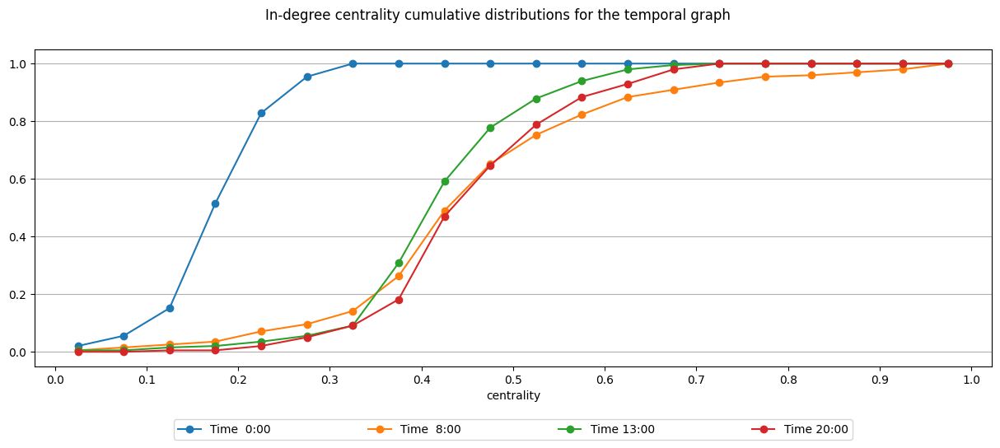

In [22]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_in_degrees, 'in-degree centrality')

#### Out-degree
Next, the *out-degree* of the nodes in temporal network is computed and the results are illustrated.

In [23]:
from utils.metrics import get_nodes_out_degree_centrality

temporal_networks_out_degrees = {
    k: get_nodes_out_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

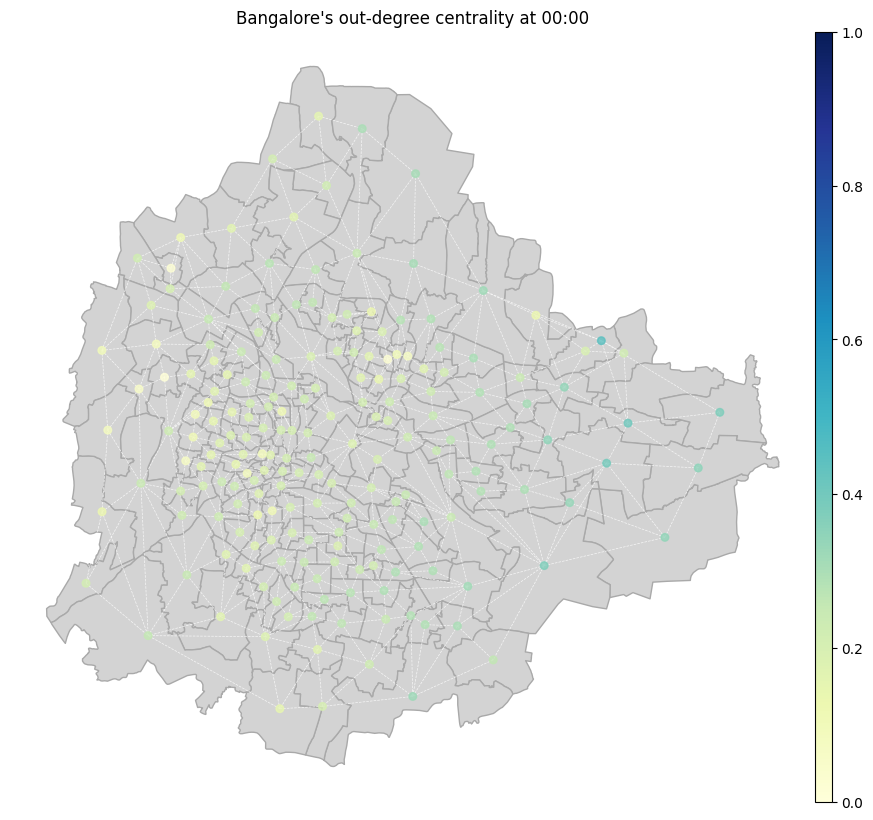

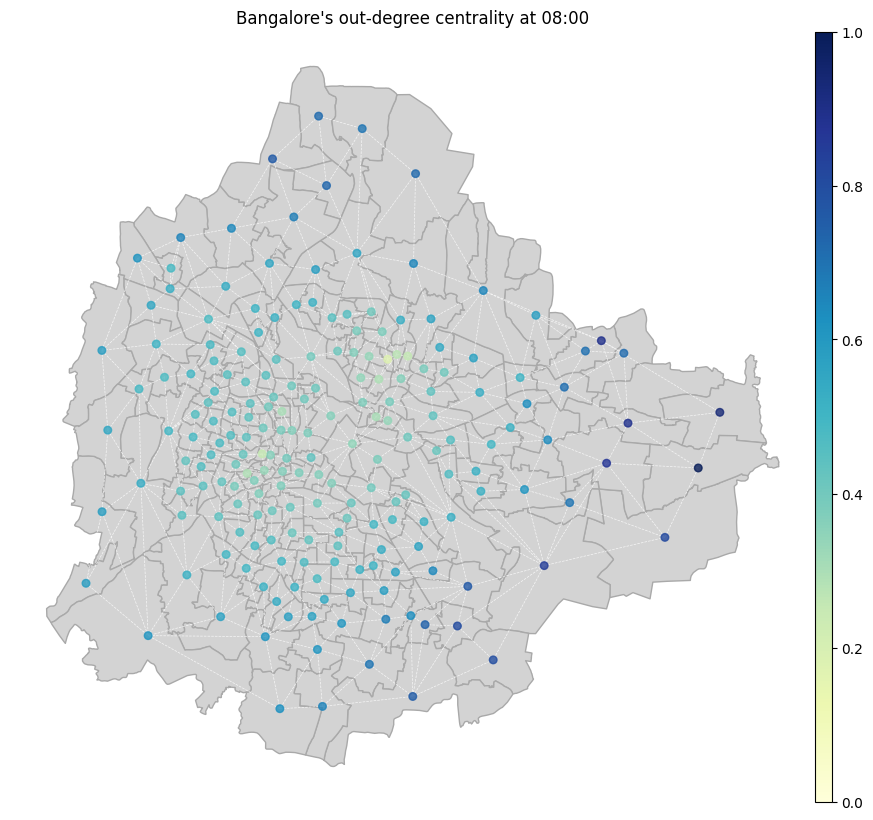

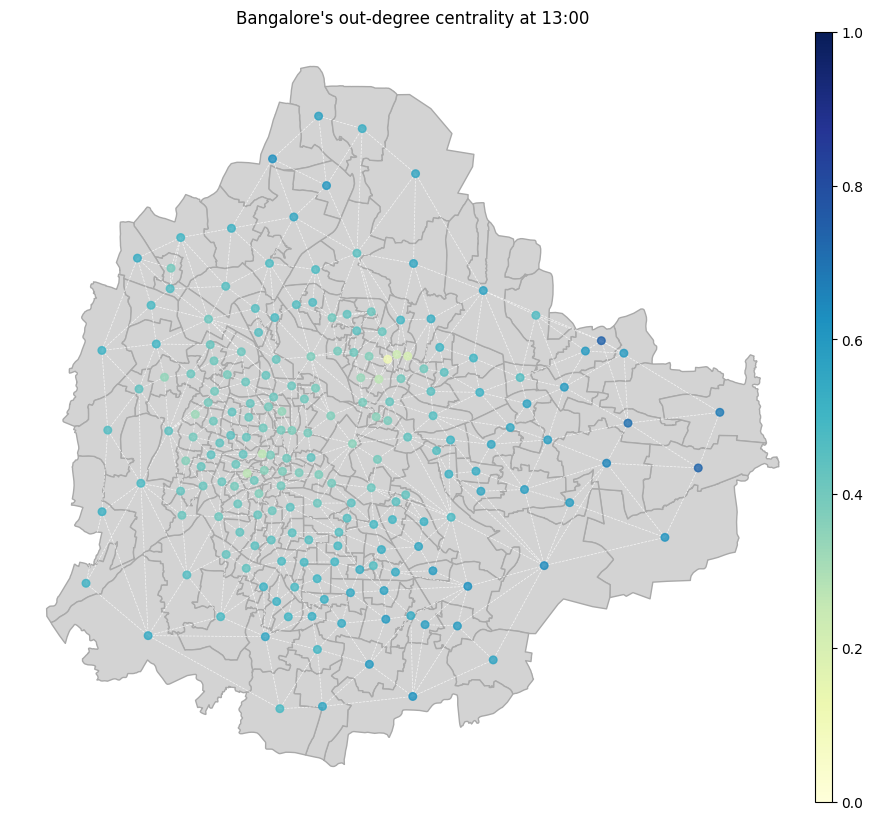

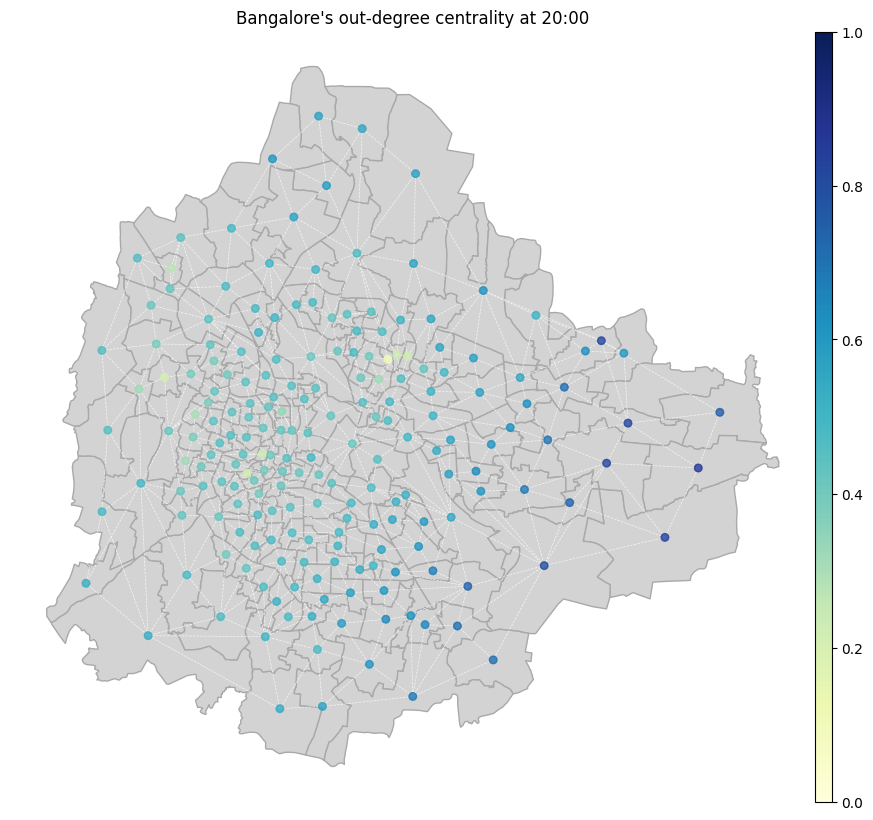

In [24]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_out_degrees, CITY_NAME, 'out-degree')

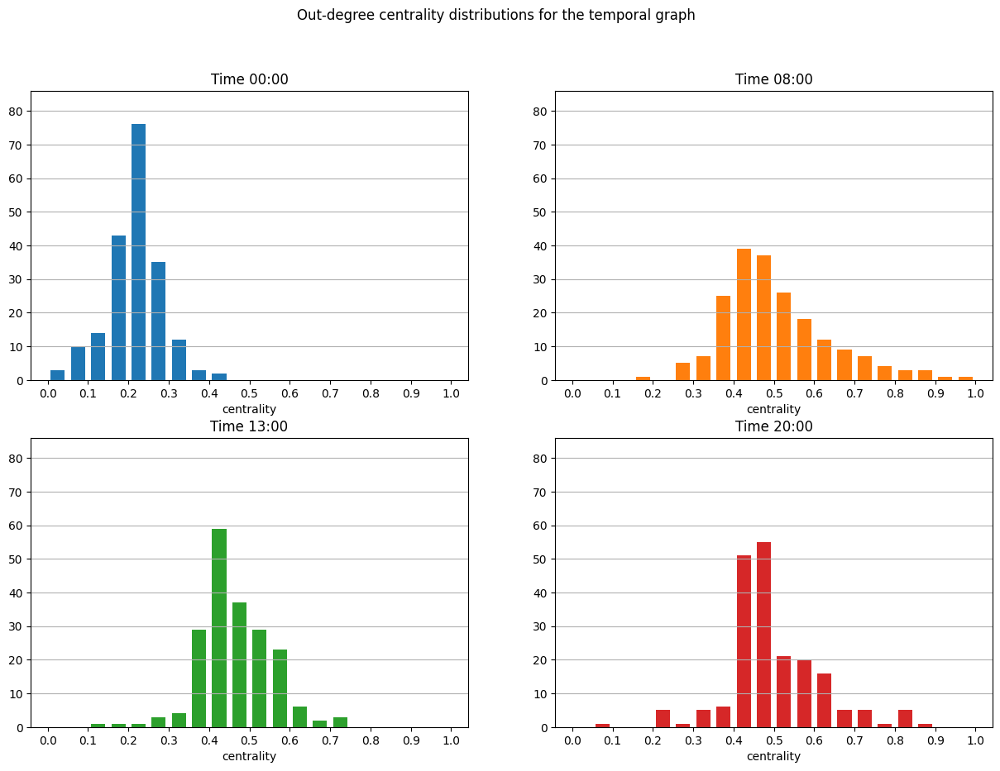

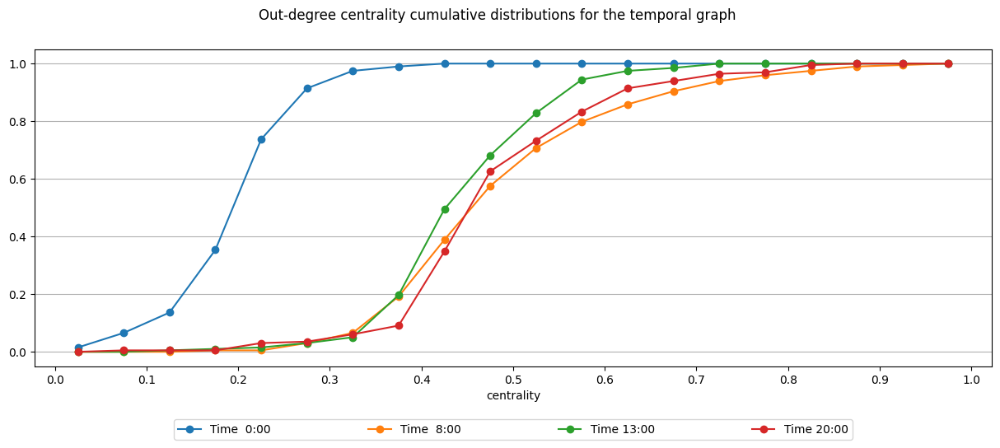

In [25]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_out_degrees, 'out-degree centrality')

### 02.1.2 Node betweenness
*Betweenness centrality* is a measure of a node's importance in a network based on the number of shortest paths that pass through it. Hence, nodes with high *betweenness centrality* are considered to be structurally important for connecting regions in the spatial graph. In the temporal graph the betweenness values of the nodes can be seen as traffic movement. Changes in this metric during different hours of the day can evaluate traffic movement and predict traffic flow.

#### Temporal Network
Firstly, the *betweenness* of the nodes is computed on the temporal network and the results are illustrated.

In [26]:
from utils.metrics import get_nodes_betweenness_centrality

temporal_networks_betweenness = {
    k: get_nodes_betweenness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

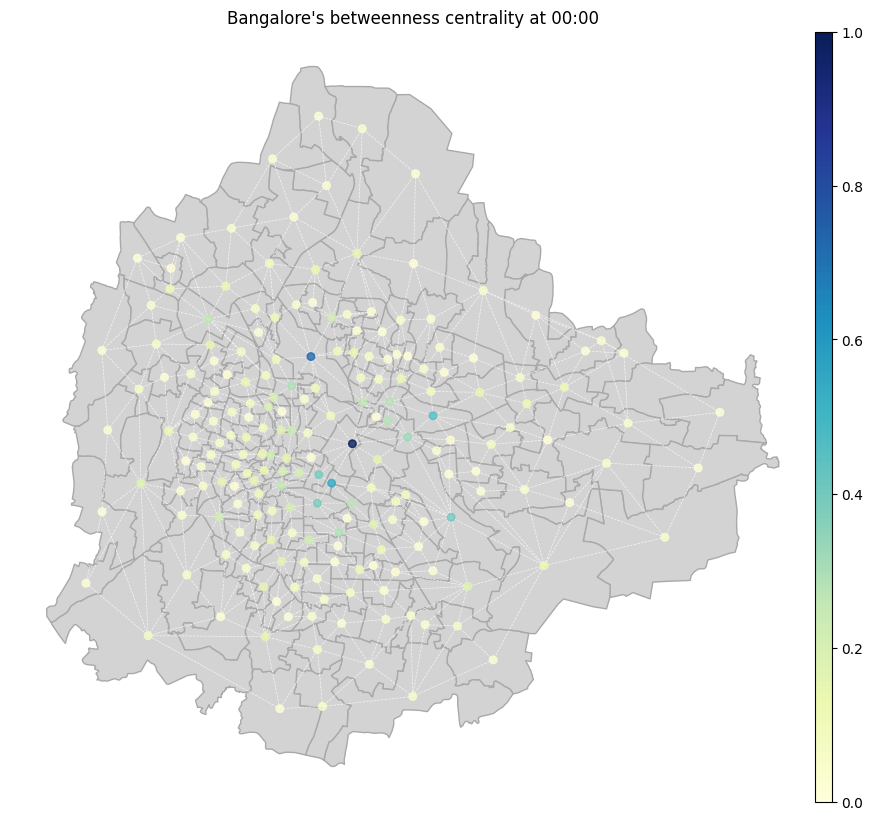

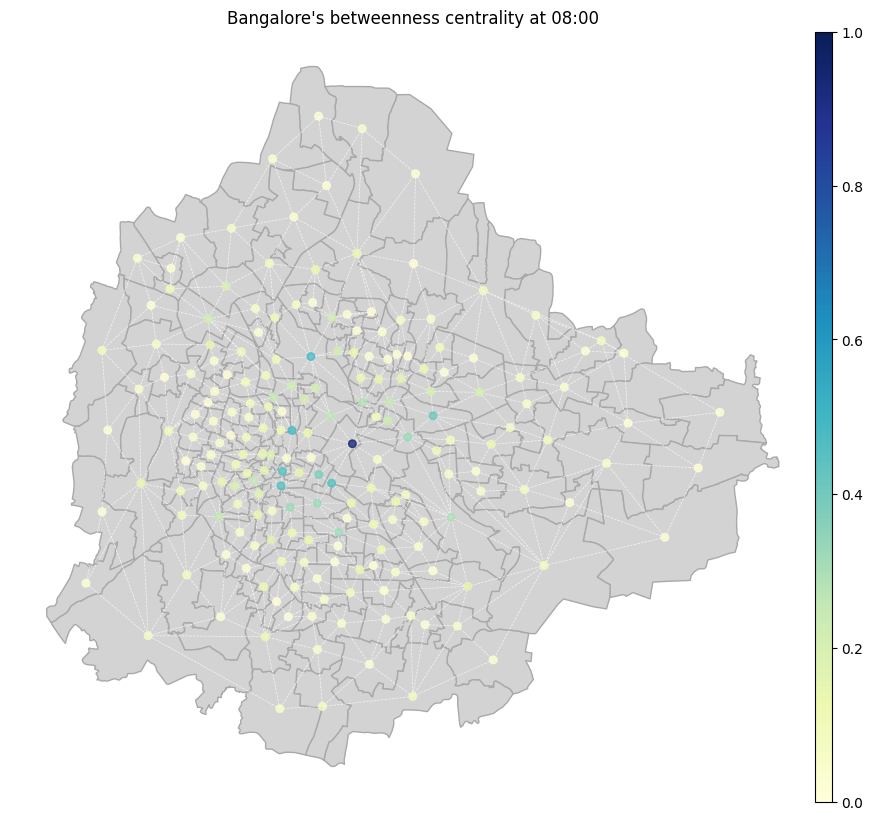

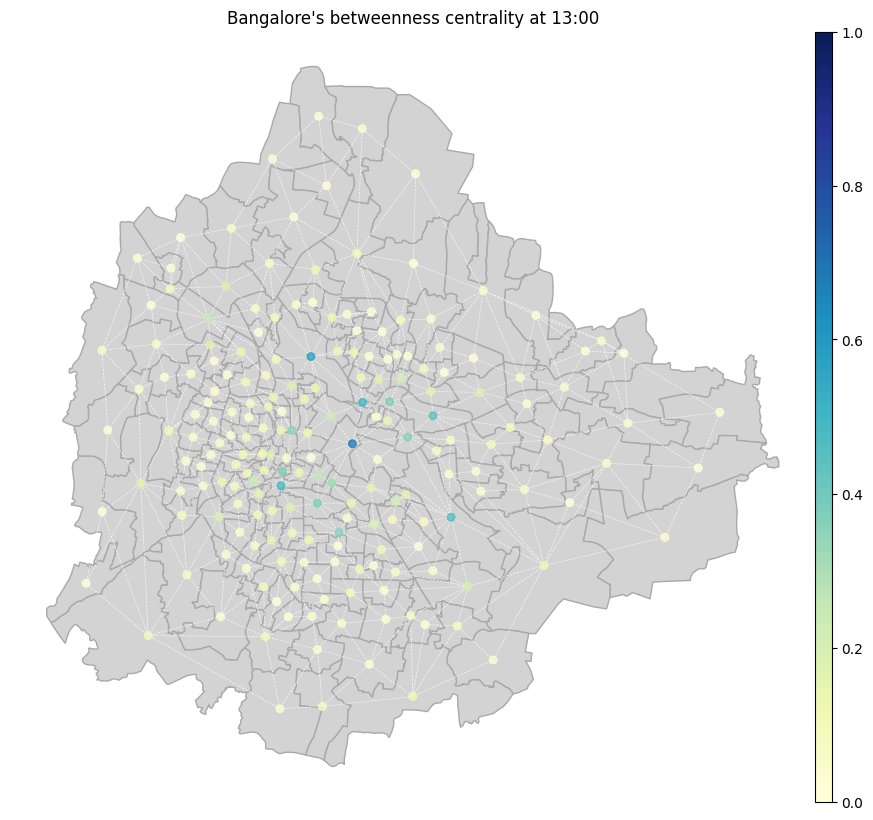

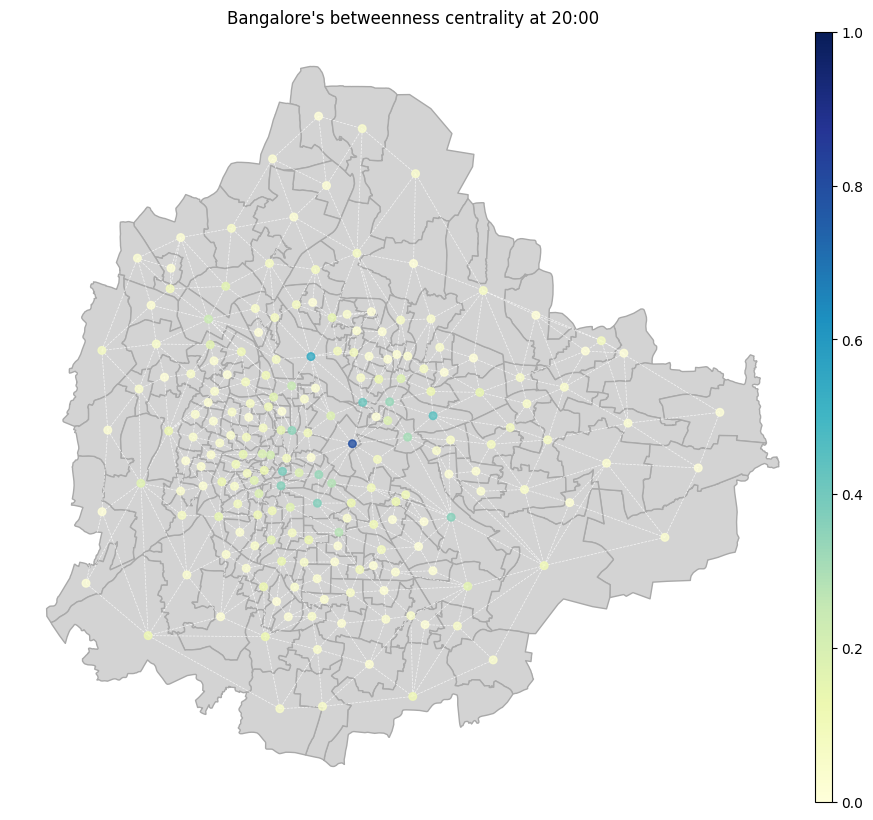

In [27]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_betweenness, CITY_NAME, 'betweenness')

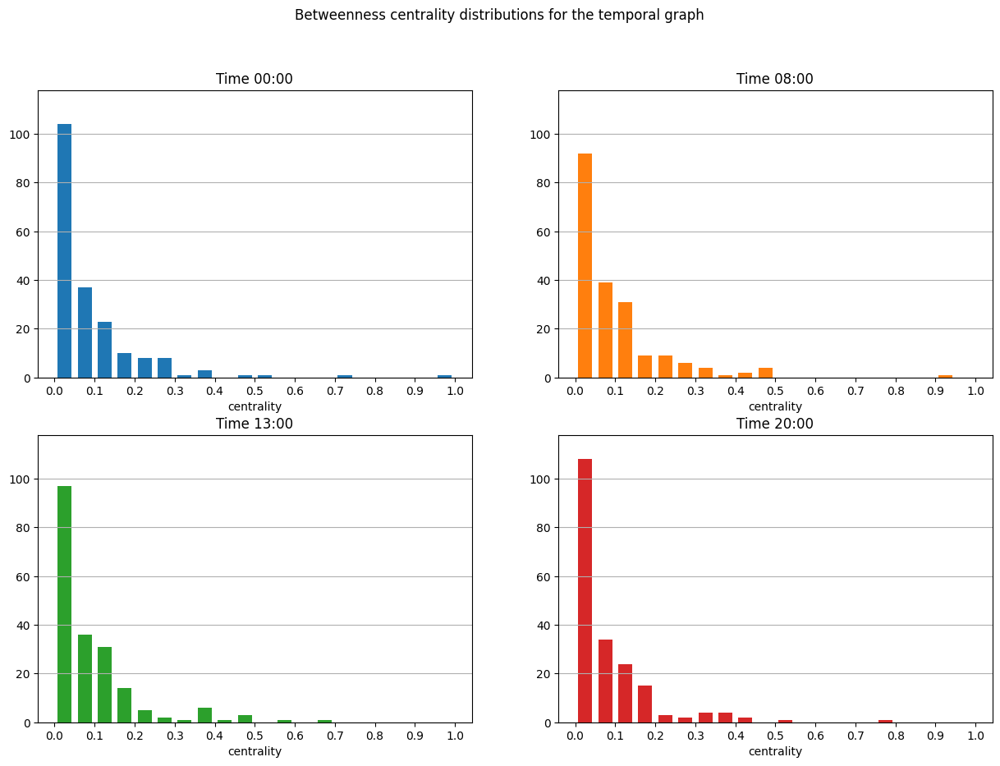

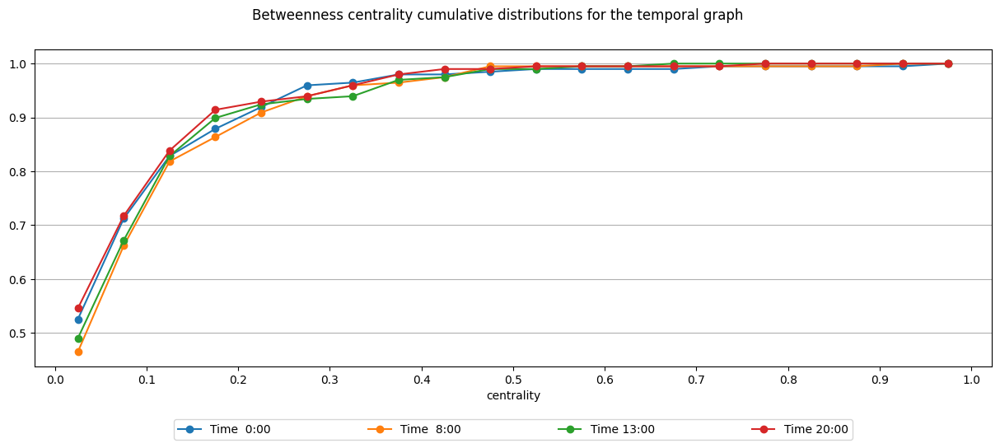

In [28]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_betweenness, 'betweenness centrality')

#### Spatial Network
Next, the *betweenness* of the nodes is computed on the spatial network and the results are illustrated.

In [29]:
from utils.metrics import get_nodes_betweenness_centrality

spatial_network_betweenness = get_nodes_betweenness_centrality(spatial_network, weight='weight', normalize=True)

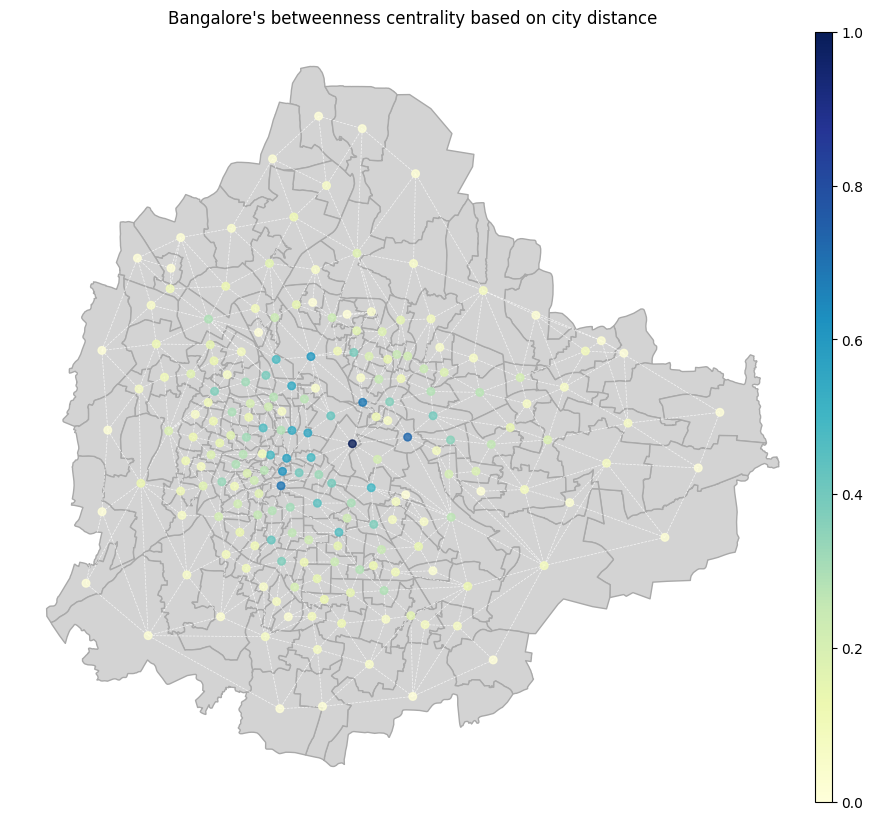

In [30]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_betweenness,
                title = f"{CITY_NAME}'s betweenness centrality based on city distance")

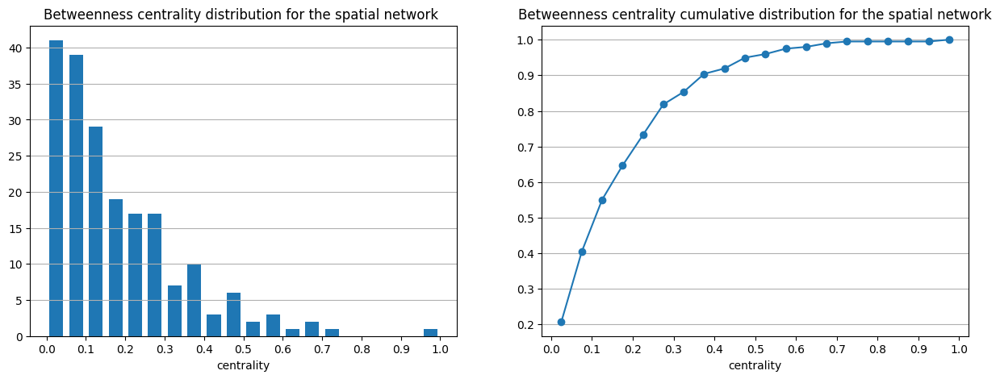

In [31]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_betweenness, 'betweenness centrality')

## 02.1.3 Node Closeness
*Closeness centrality* measures nodes' importance in a network based on how quickly it can reach all other nodes in the network. Regions with high *closeness centrality* can quickly access other areas in the network. So in the spatial and temporal graph the nodes in the center should have the highest closeness centrality scores.

In [32]:
from utils.metrics import get_nodes_closeness_centrality

temporal_networks_closeness = {
    k: get_nodes_closeness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

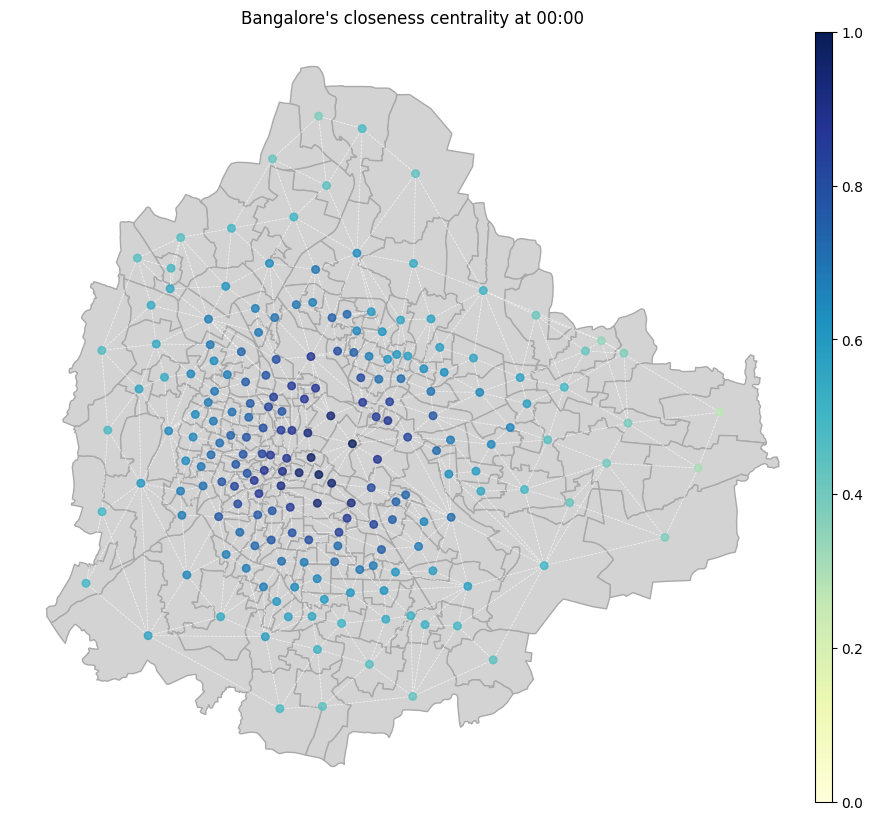

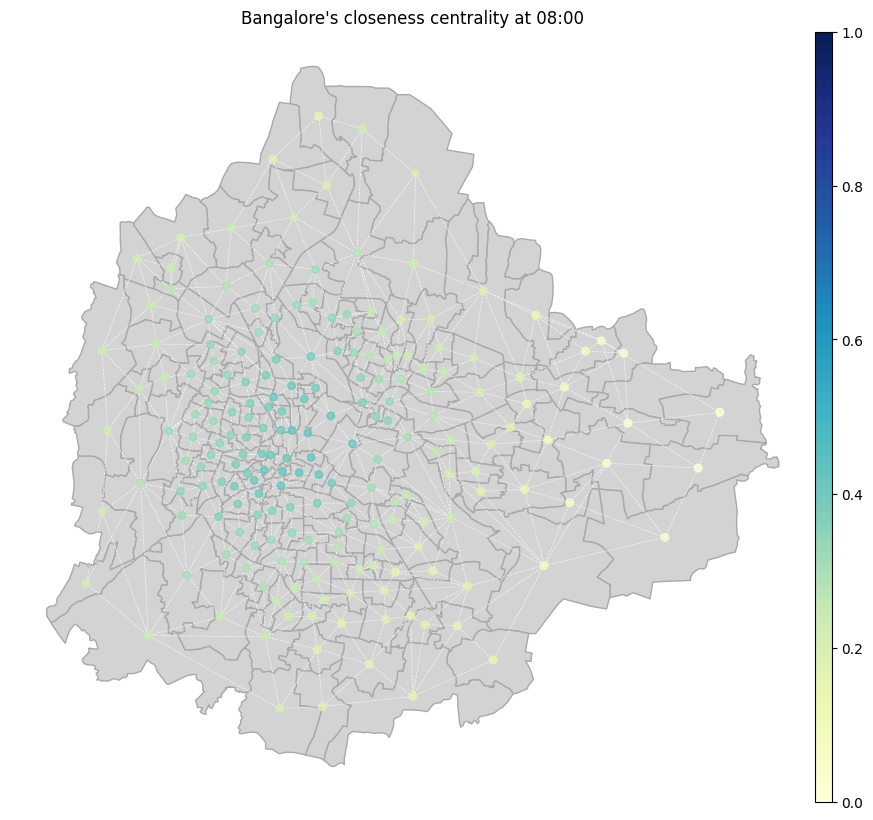

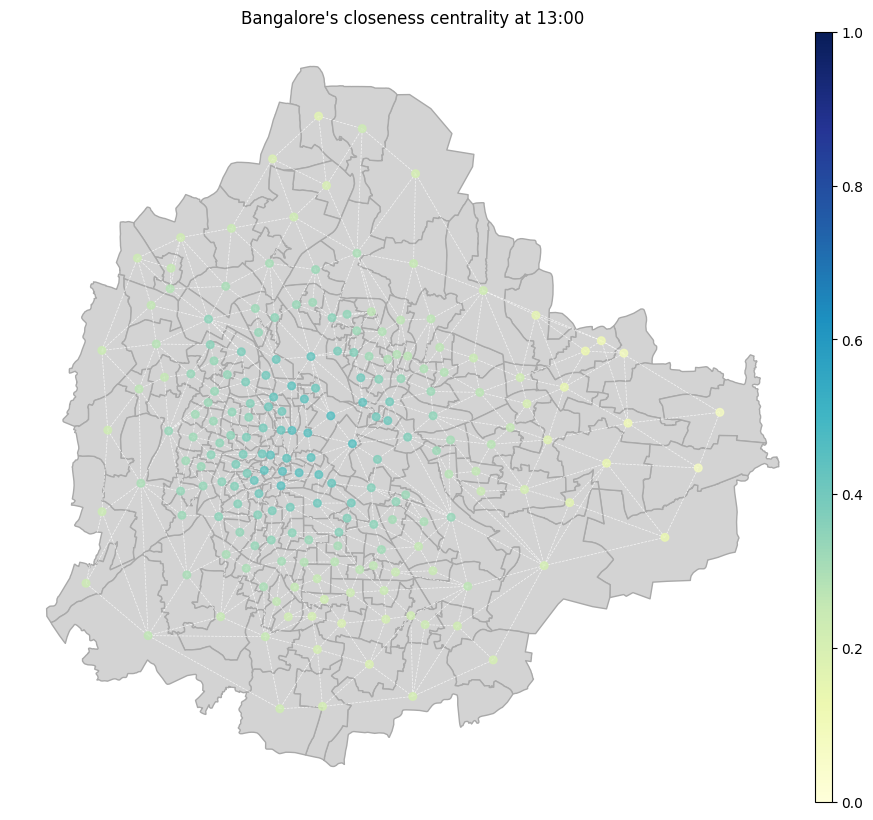

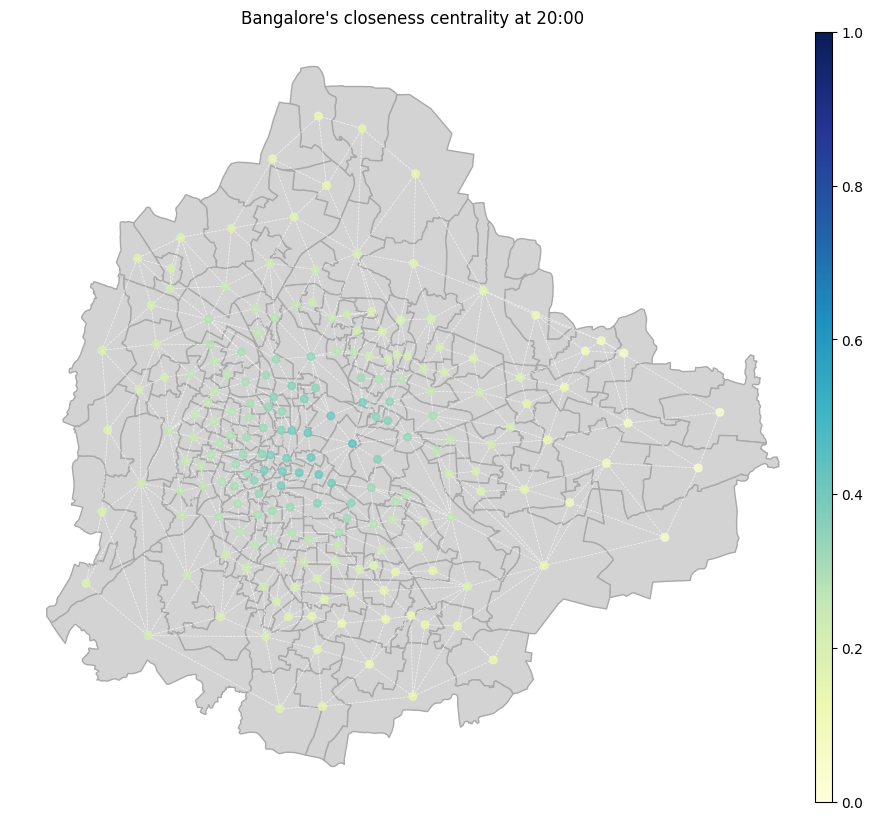

In [33]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_closeness, CITY_NAME, 'closeness')


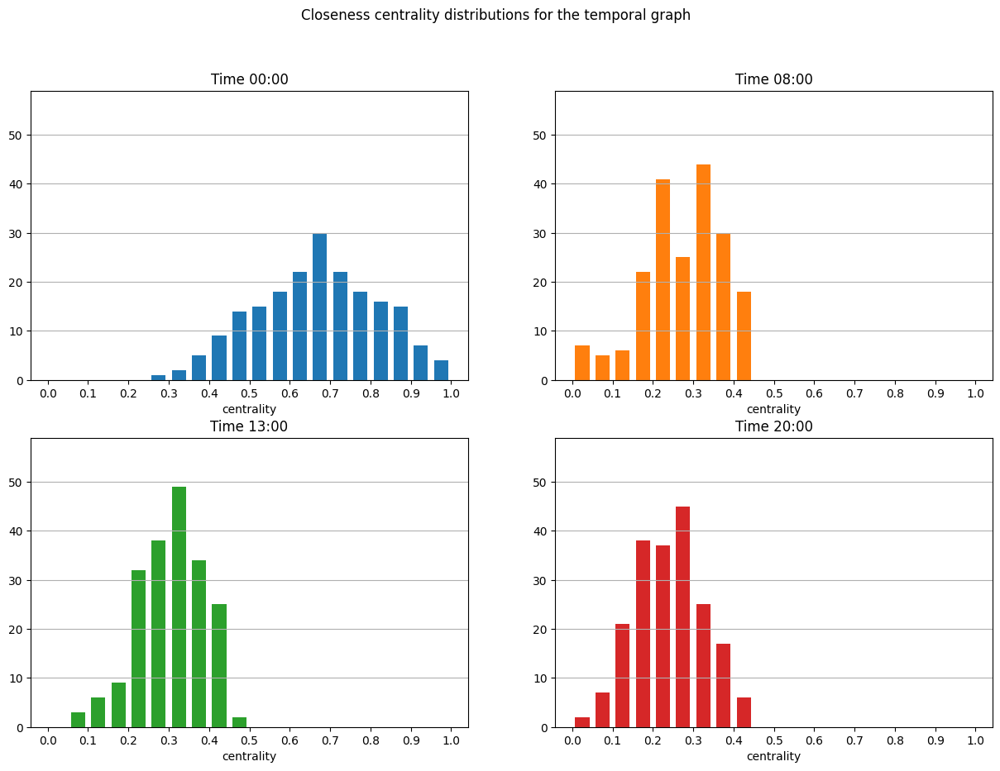

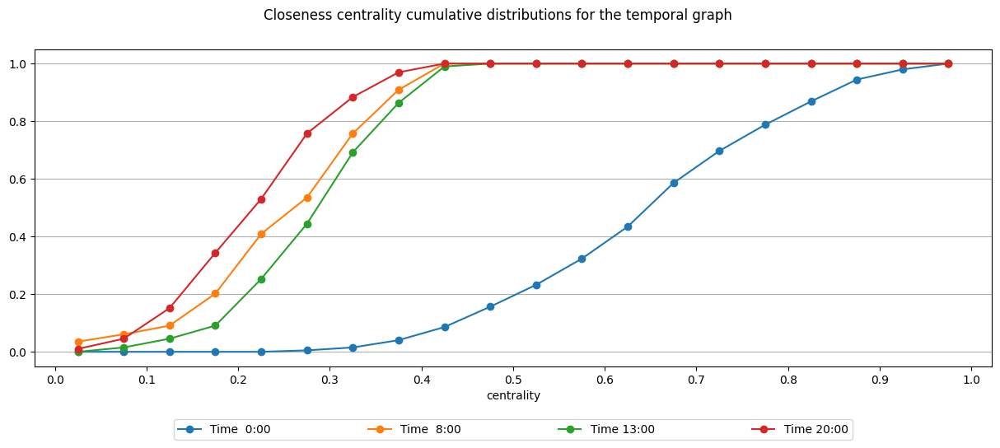

In [34]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_closeness, 'closeness centrality')

#### Spatial Network
Next, the *closeness* of the nodes is computed on the spatial network and the results are illustrated.

In [35]:
from utils.metrics import get_nodes_closeness_centrality

spatial_network_closeness = get_nodes_closeness_centrality(spatial_network, weight='weight', normalize=True)

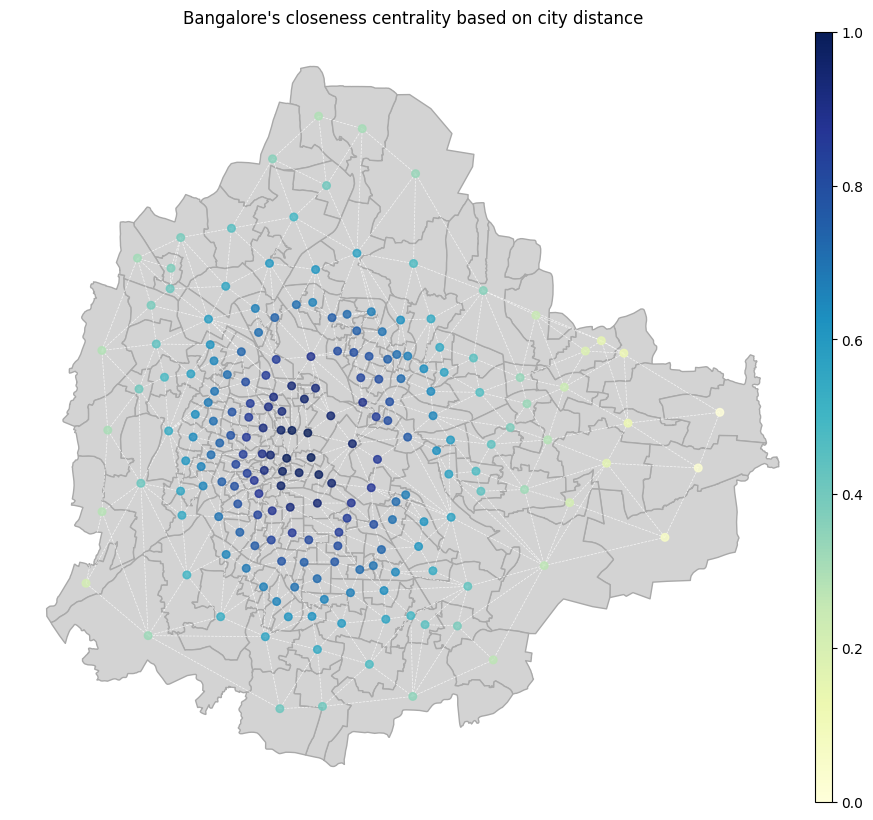

In [36]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_closeness,
                title=f"{CITY_NAME}'s closeness centrality based on city distance")


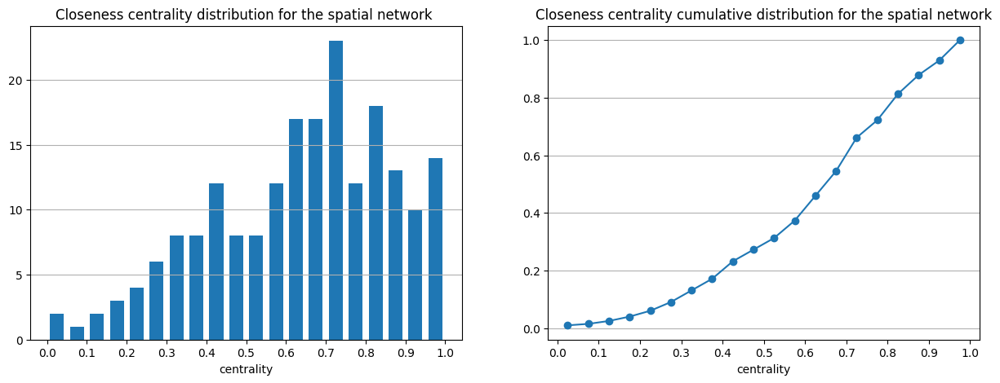

In [37]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_closeness, 'closeness centrality')

### 02.1.4 Nodes PageRank
*PageRank centrality* considers a node's importance based on the number and quality of links pointing to it. In the context of traffic analysis, links to central regions count more compared to the low transit regions. The *PageRank* of nodes in the temporal graph reflects the amount of traffic directed to them or adjacent regions and it can be employed to locate hotspots in cities during various times of the day. In the spatial graph, it highlights zones that connect densely joined regions.

#### Temporal Network
Firstly, the *PageRank* of the nodes is computed on the temporal network and the results are illustrated.

In [38]:
from utils.metrics import get_nodes_pagerank_centrality

temporal_networks_pagerank = {
    k: get_nodes_pagerank_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

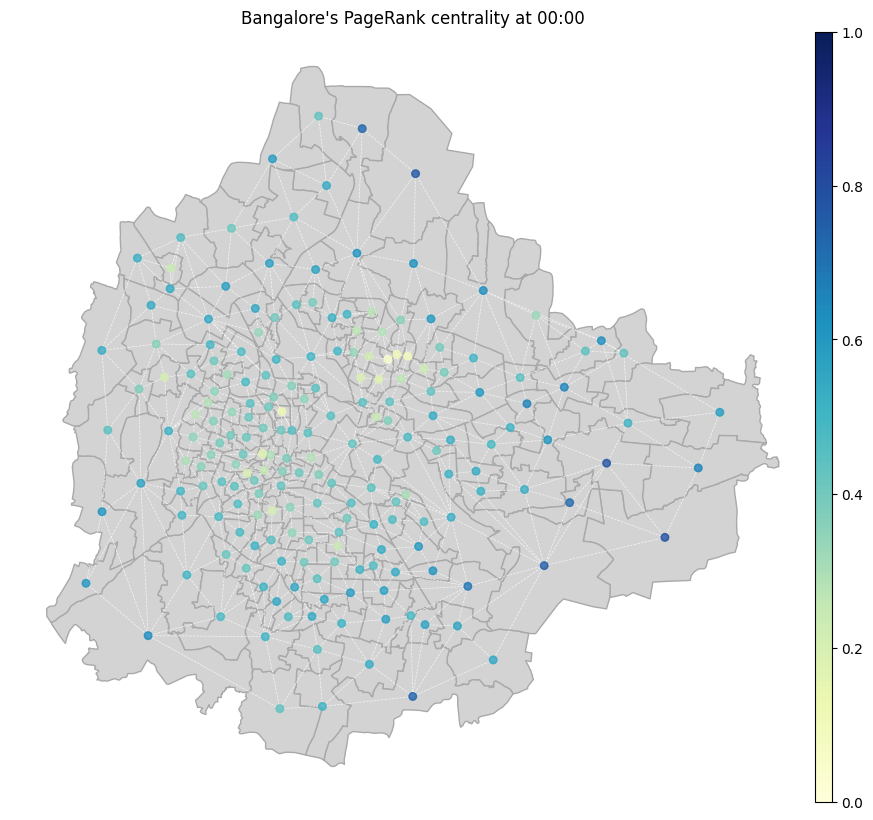

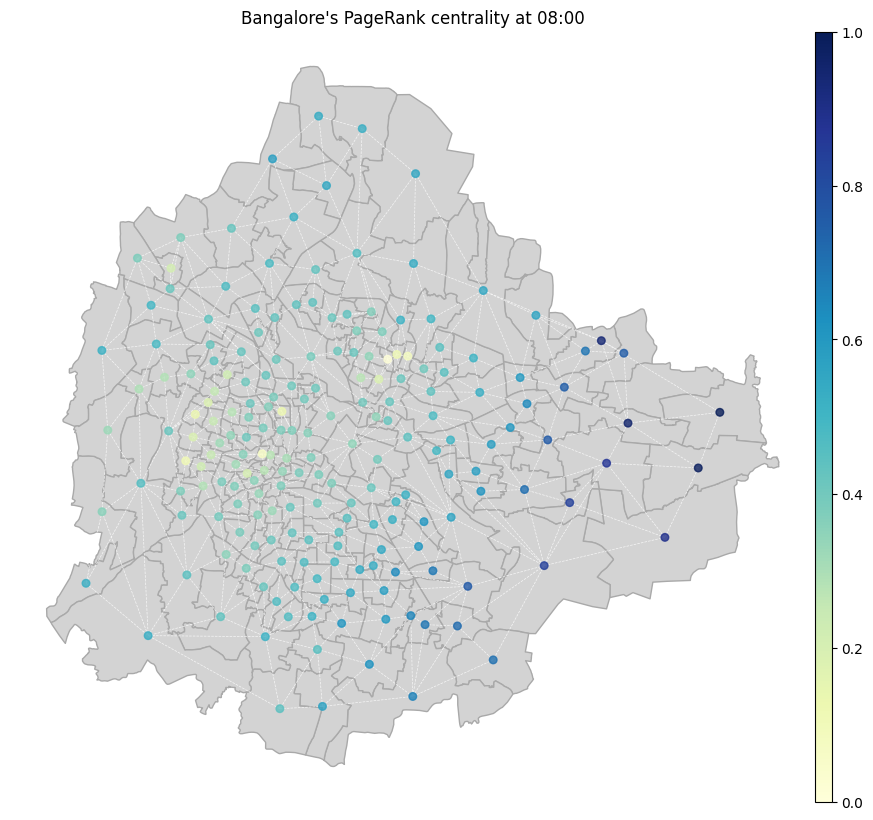

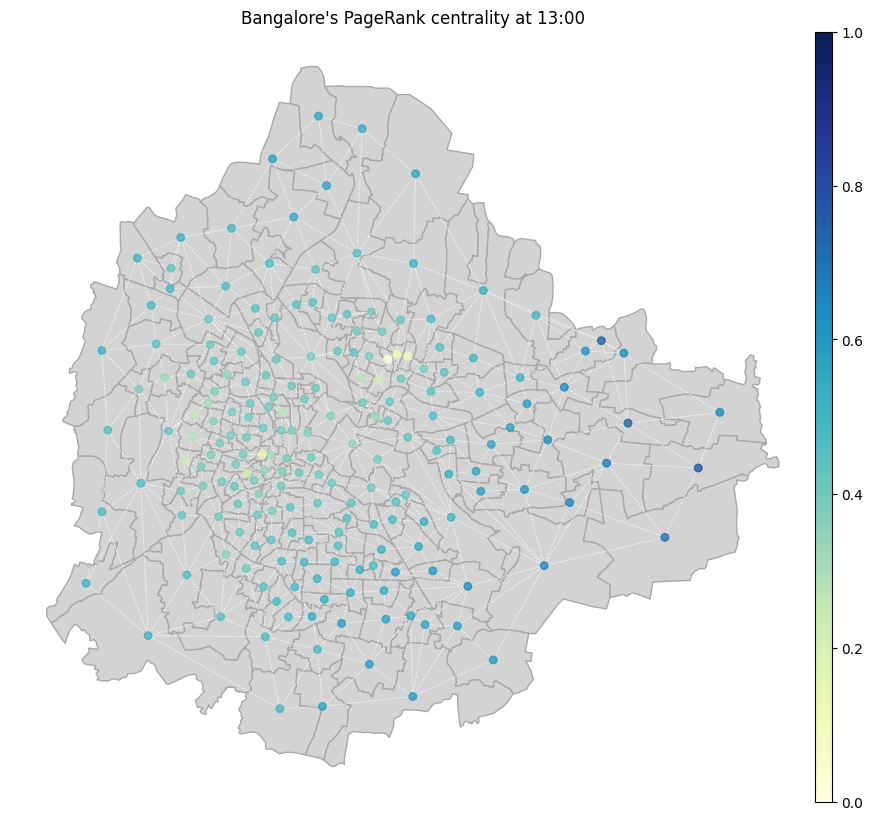

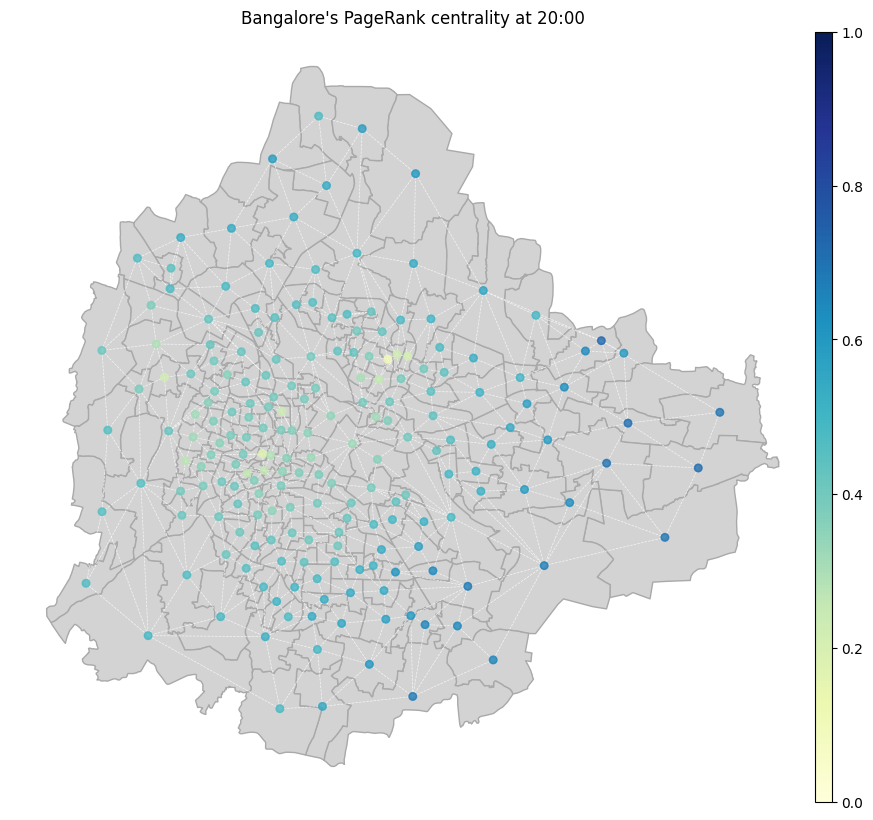

In [39]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_pagerank, CITY_NAME, 'PageRank')

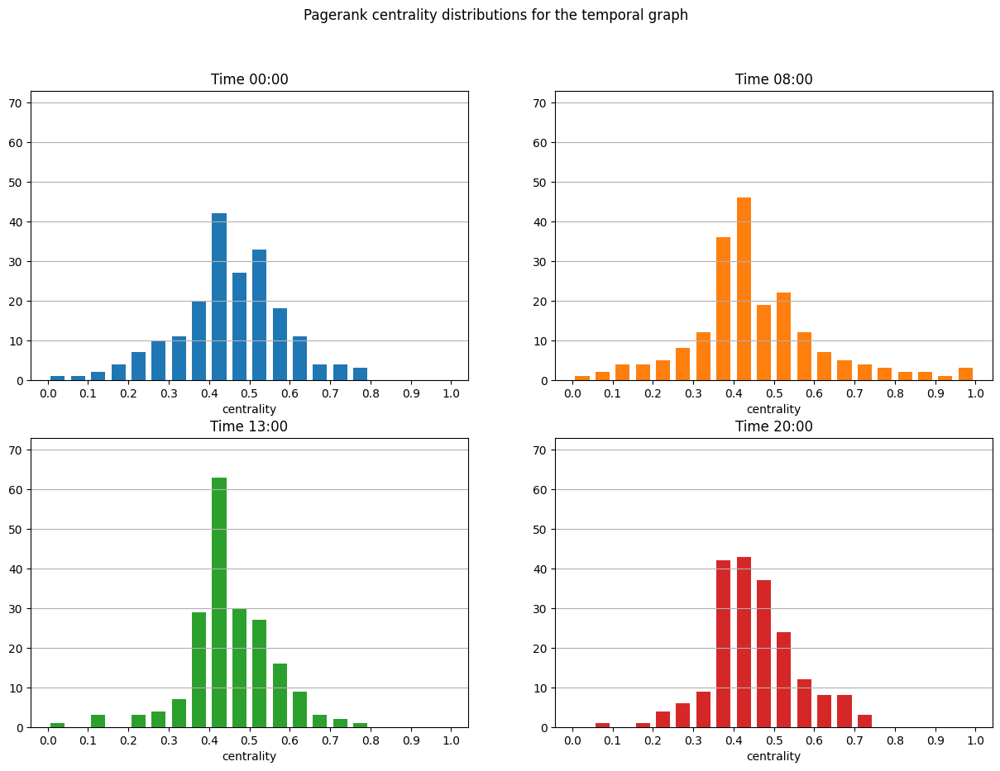

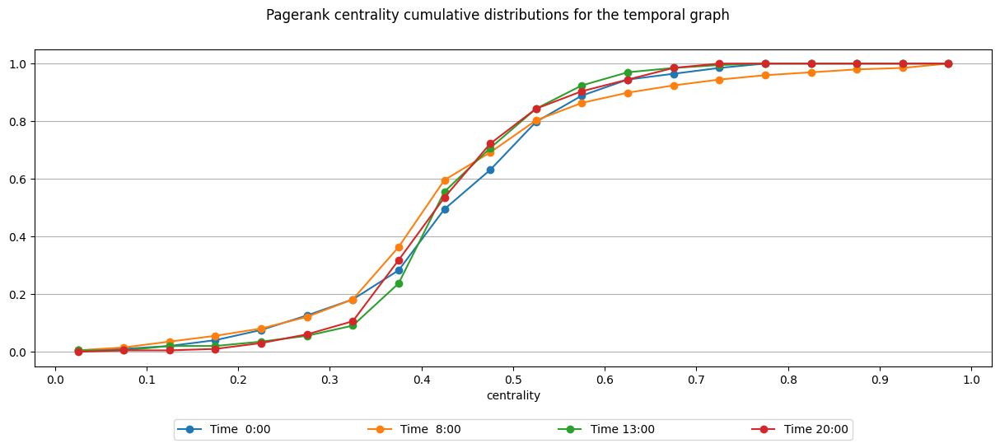

In [40]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_pagerank, 'PageRank centrality')

#### Spatial Network
Next, the *PageRank* of the nodes is computed on the spatial network and the results are illustrated.

In [41]:
from utils.metrics import get_nodes_pagerank_centrality

spatial_network_pagerank = get_nodes_pagerank_centrality(spatial_network, weight='weight', normalize=True)

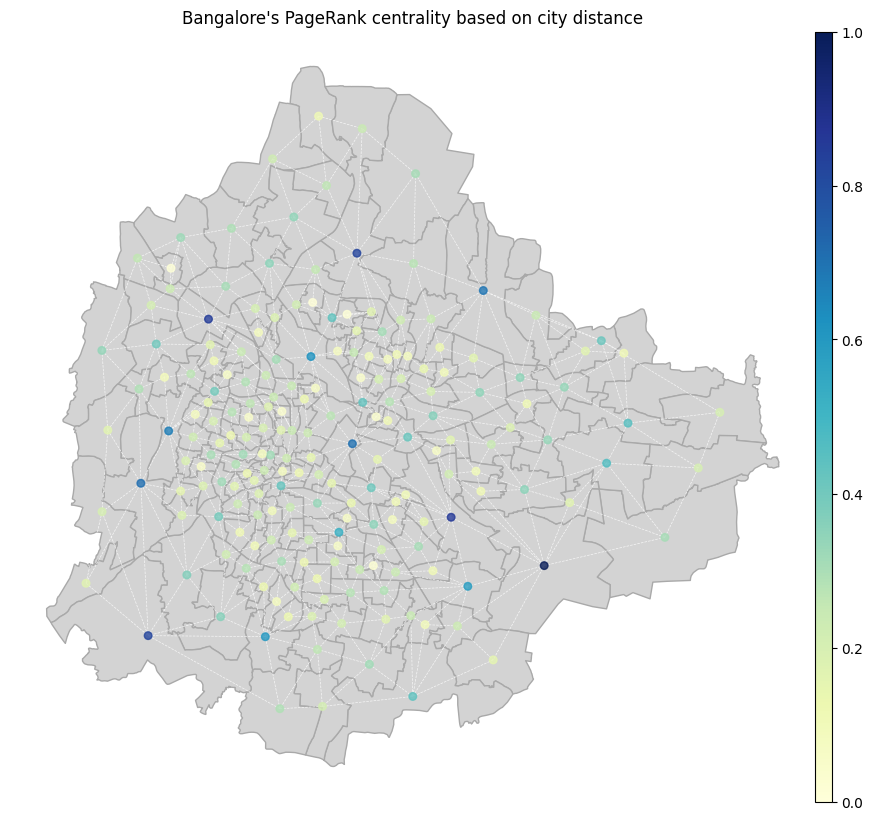

In [42]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_pagerank,
                title=f"{CITY_NAME}'s PageRank centrality based on city distance")


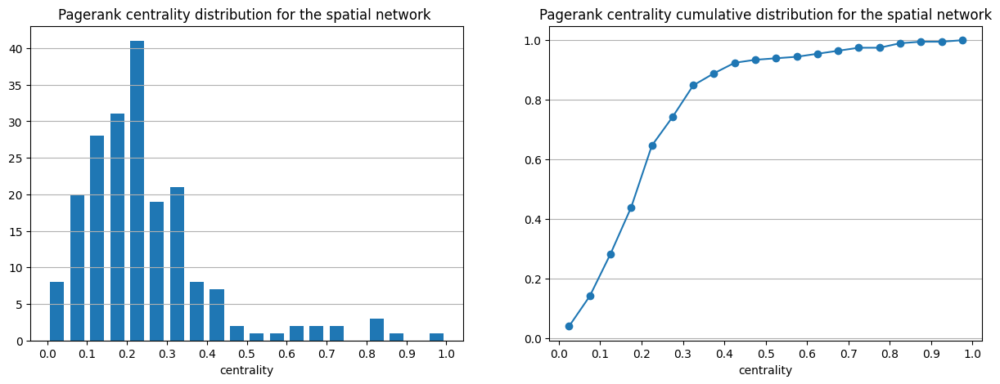

In [43]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_pagerank, 'PageRank centrality')

### 02.1.5 HITS measure for Nodes Hubs and Authorities
It gives each node in a directed network two centrality scores: the *Authority* and the *Hub* centrality. High authority nodes are the "more resourceful", hence the ones receiving more links. Differently, high hub scores are given to nodes that connect to high authority nodes. In the temporal graphs, authority can be interpreted as a measure of total time invested to reach a given region, while hub scores are a measure of the total time spent to drive to main travel regions. The results of this metric on the spatial graph are not
particularly important.

In [44]:
from utils.metrics import get_nodes_hits_centrality

temporal_networks_hubs = dict()
temporal_networks_authorities = dict()

for k, v in temporal_networks_dict.items():
    hubs, authorities = get_nodes_hits_centrality(v, normalize=True, weight='mean_travel_time')
    temporal_networks_hubs[k] = hubs
    temporal_networks_authorities[k] = authorities

#### Temporal Network Hubs
Firstly, the *Hubs* of the nodes is computed on the temporal network and the results are illustrated.

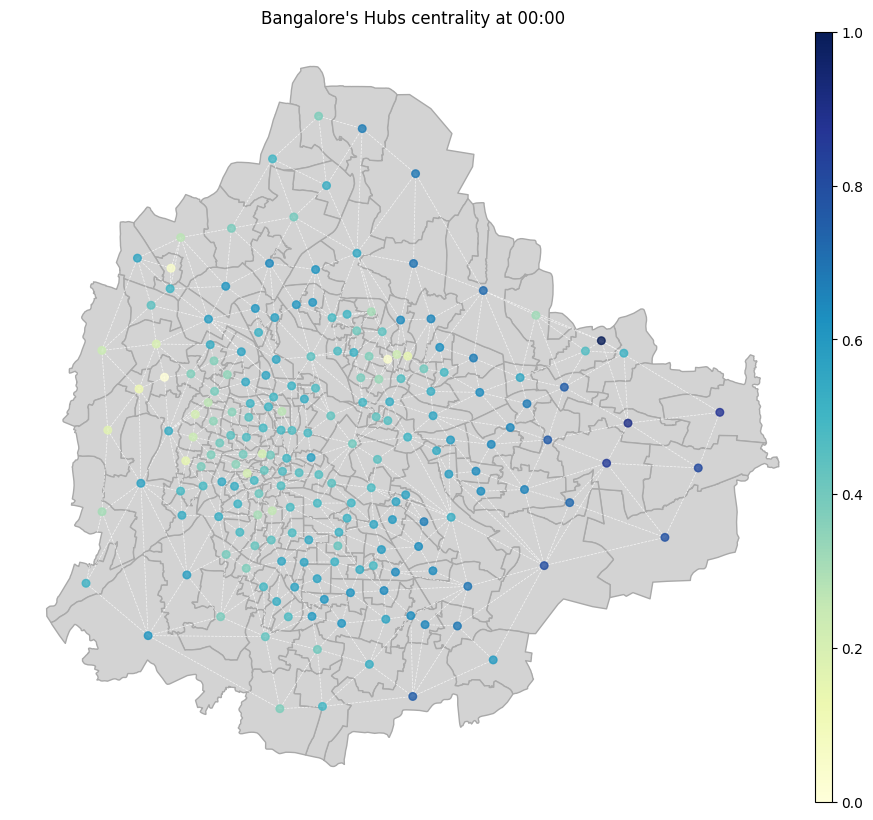

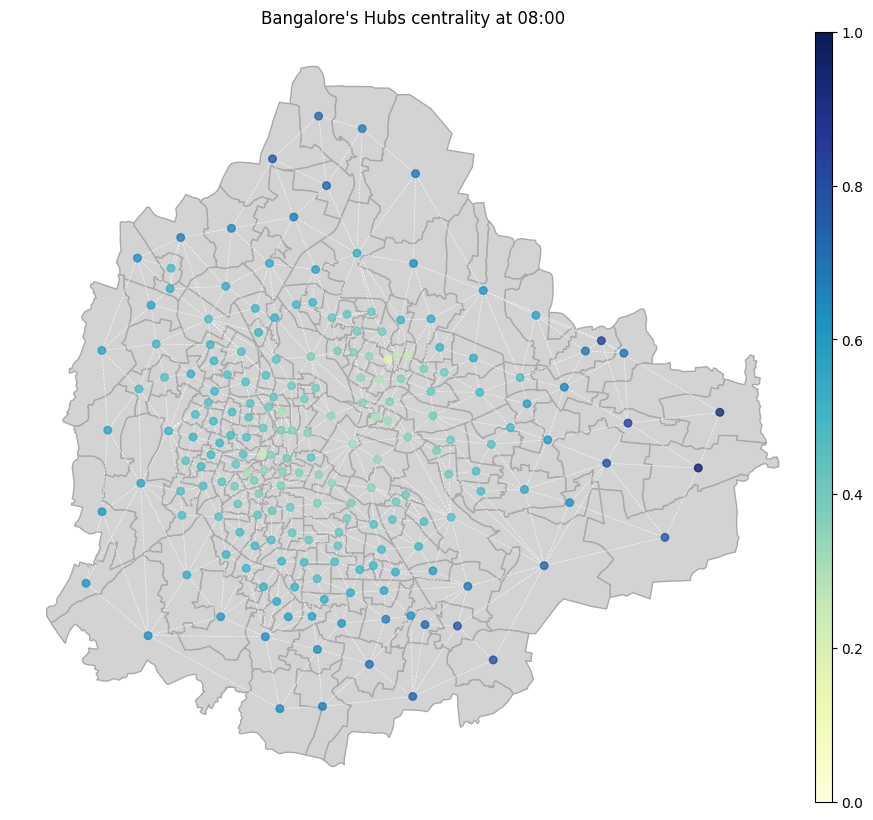

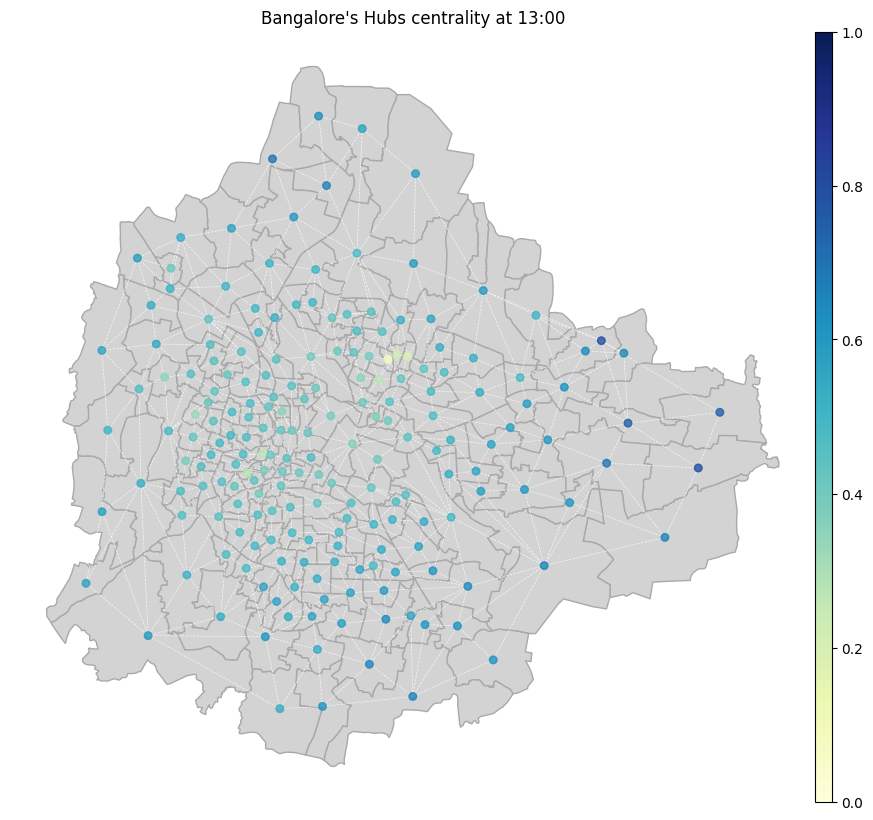

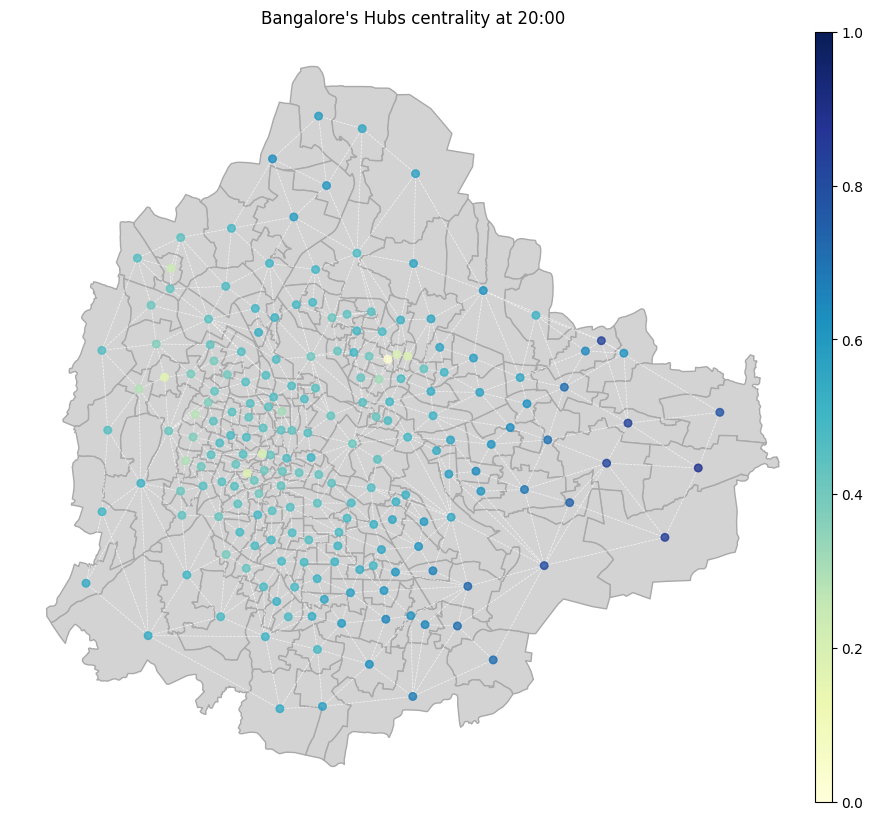

In [45]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_hubs, CITY_NAME, 'Hubs')

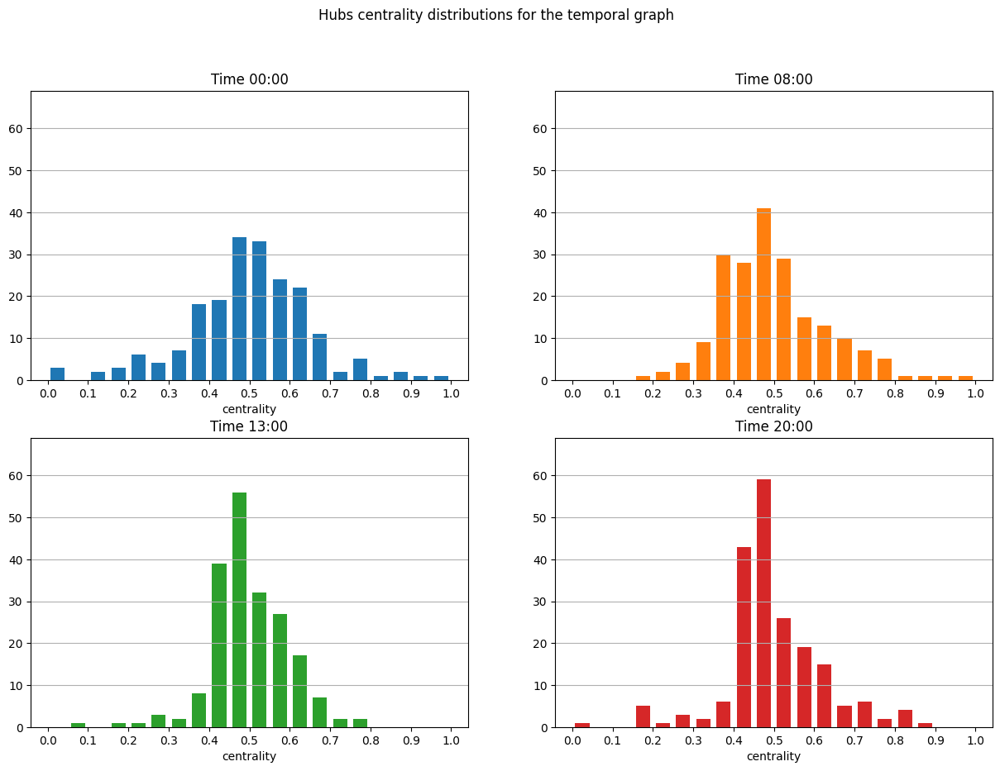

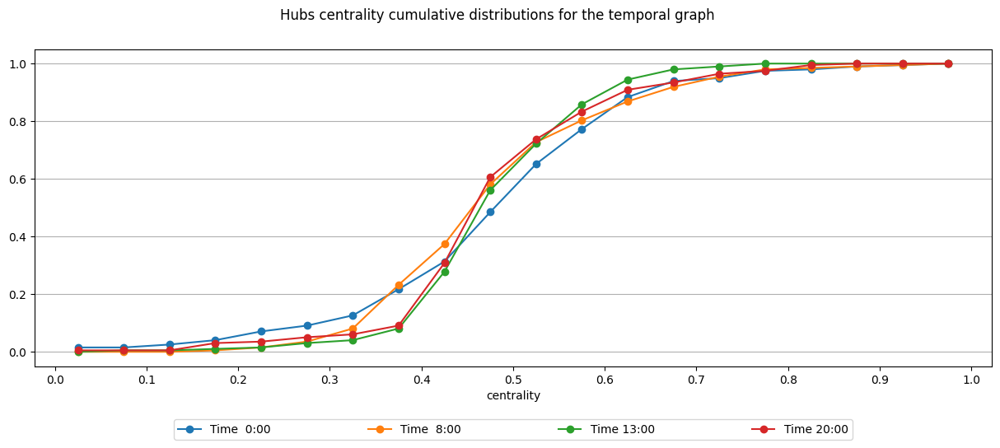

In [46]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_hubs, 'hubs centrality')

#### Temporal Network Authorities
Next, the *Authorities* of the nodes is computed on the temporal network and the results are illustrated.

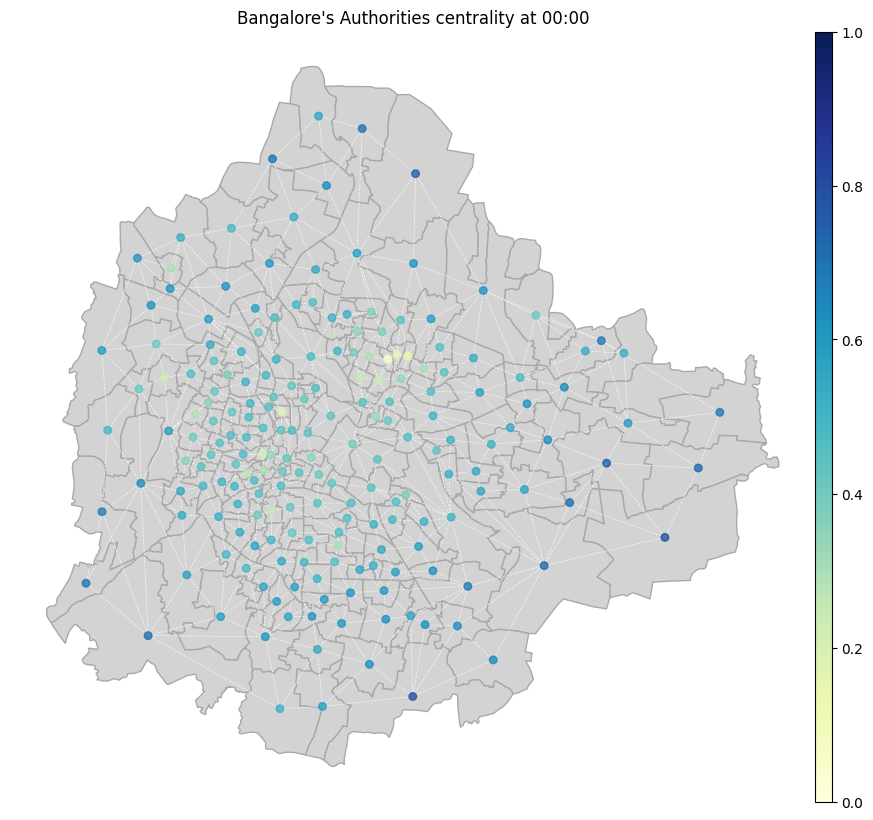

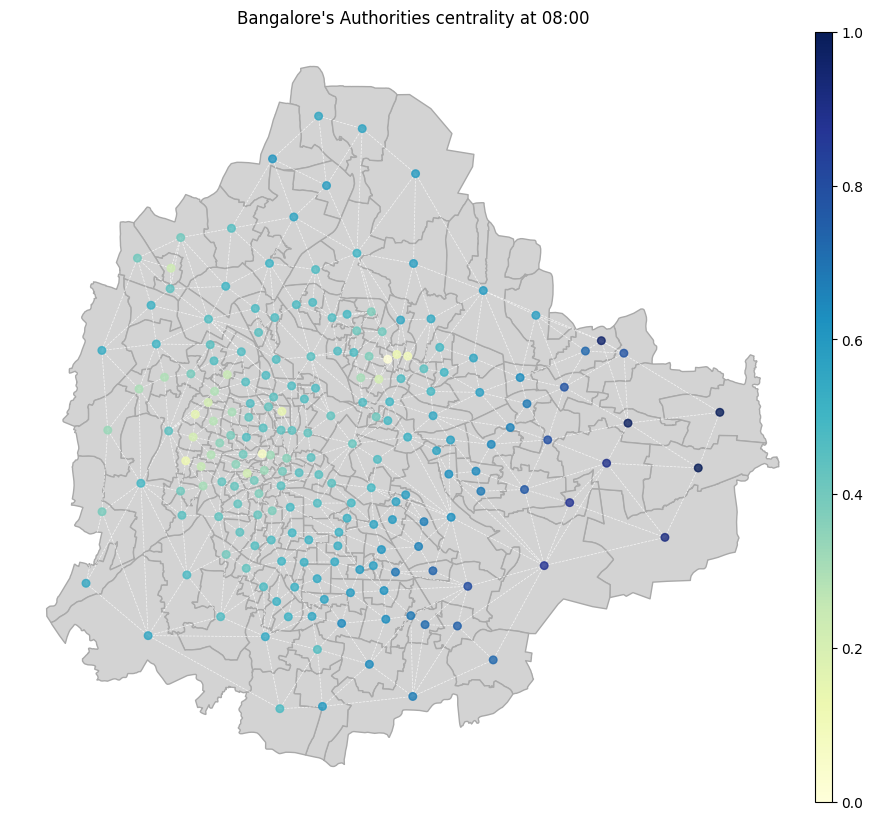

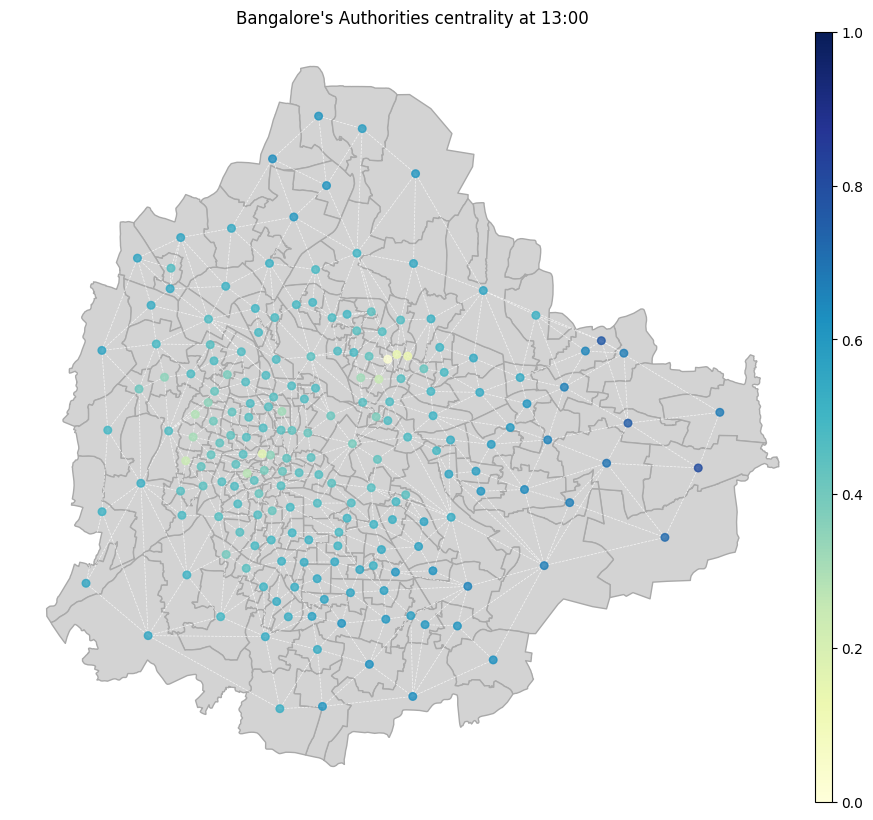

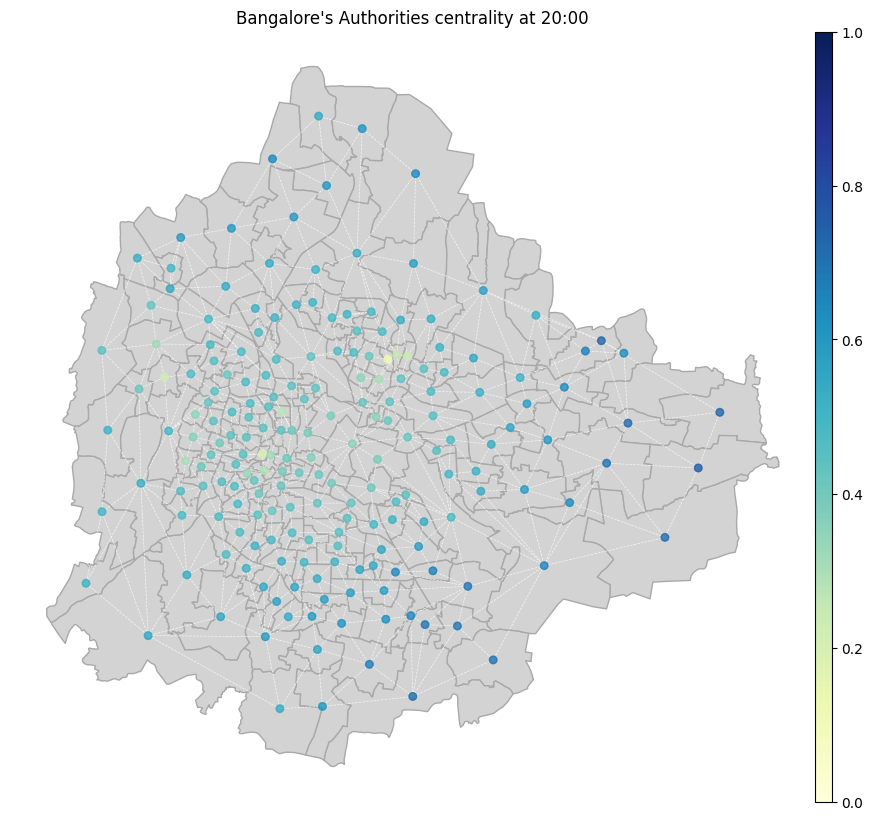

In [47]:
from utils.graphics import plot_normalized_temporal_centralities

plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_authorities, CITY_NAME, 'Authorities')

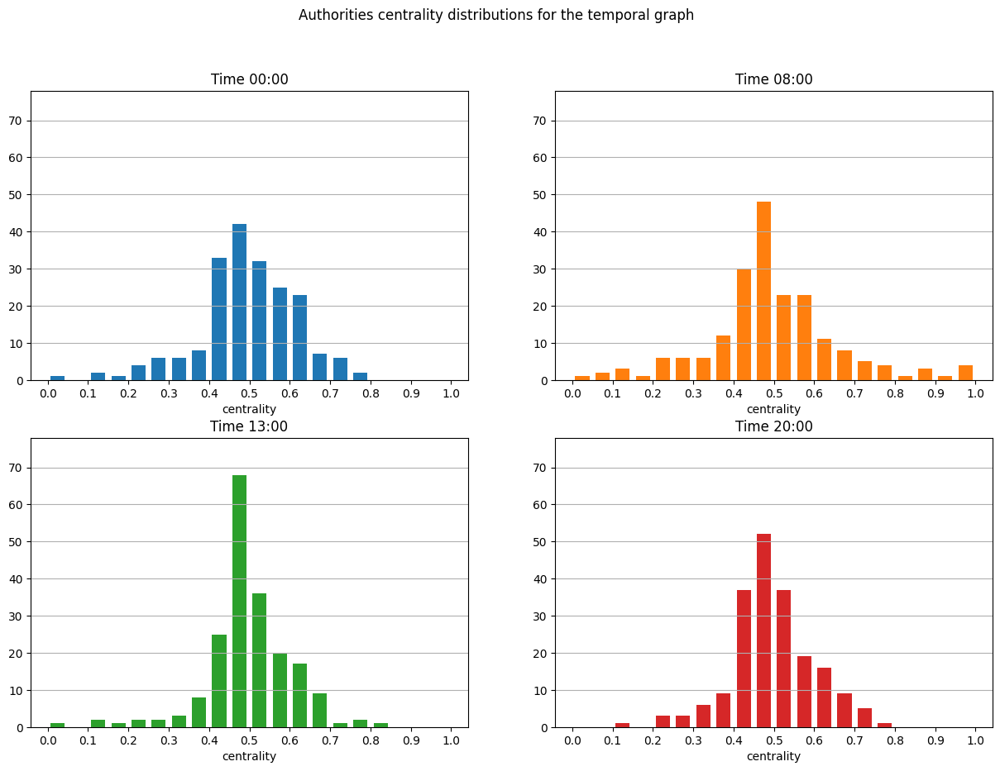

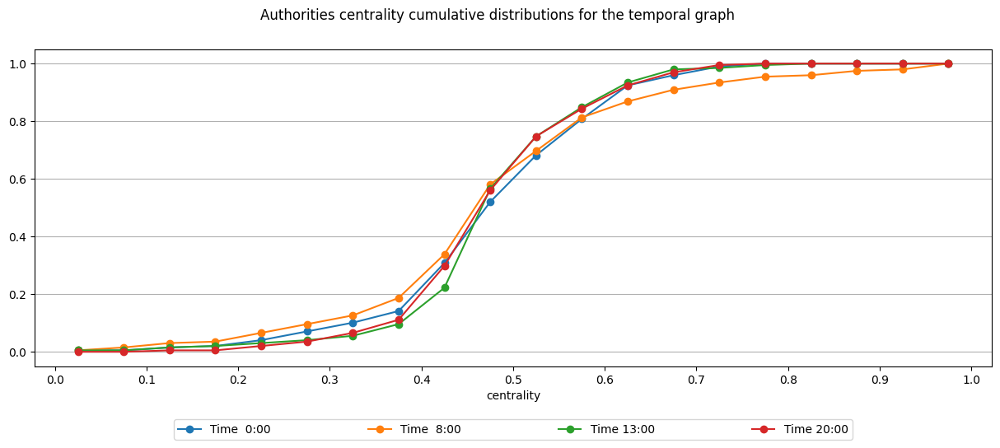

In [48]:
from utils.graphics import plot_temporal_network_centrality_distribution

plot_temporal_network_centrality_distribution(temporal_networks_authorities, 'authorities centrality')

#### Spatial Network Hubs and Authorities
Finally, the *Hubs* and *Authorities* of the nodes are computed on the spatial network and the results are illustrated.

In [49]:
from utils.metrics import get_nodes_hits_centrality

spatial_network_hits = get_nodes_hits_centrality(spatial_network, weight='weight', normalize=False)

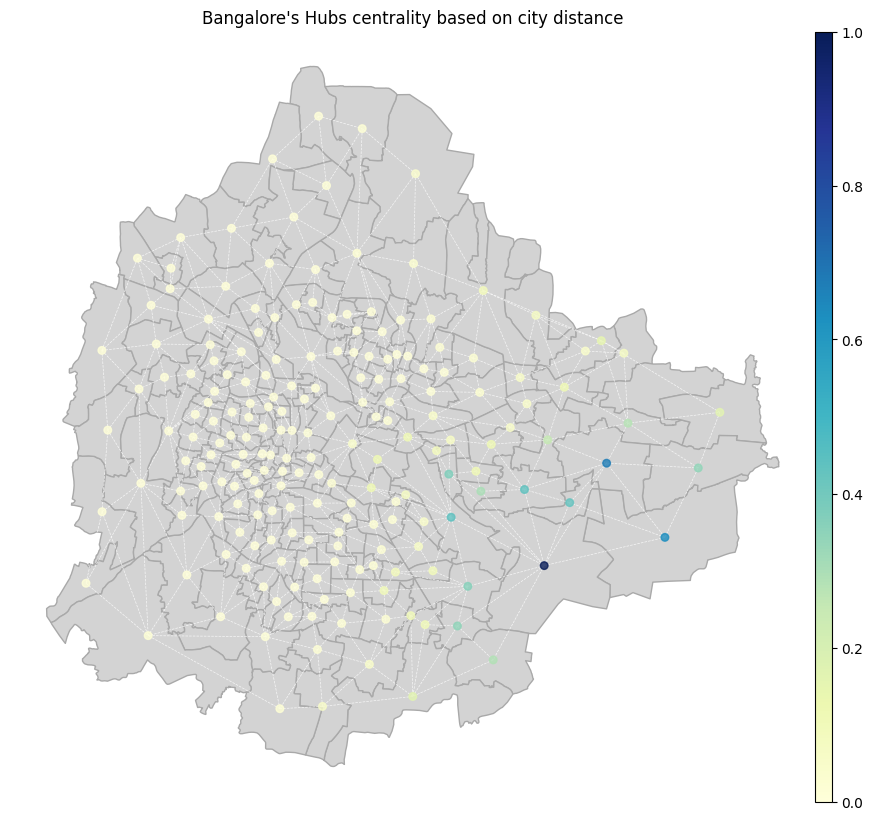

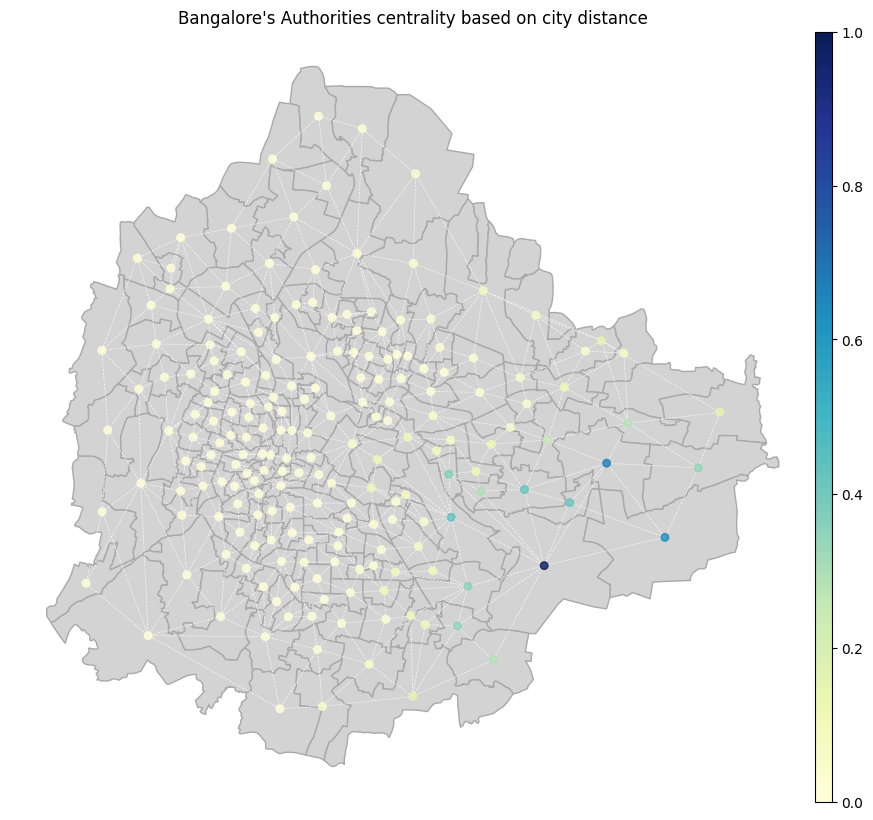

In [50]:
from utils.graphics import plot_centrality

plot_centrality(gdf, spatial_network, spatial_network_hits[0],
                title = f"{CITY_NAME}'s Hubs centrality based on city distance")

plot_centrality(gdf, spatial_network, spatial_network_hits[1],
                title = f"{CITY_NAME}'s Authorities centrality based on city distance")


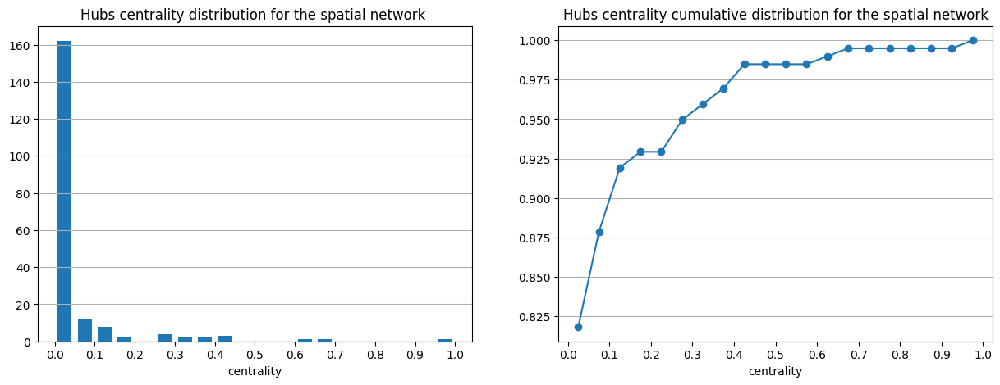

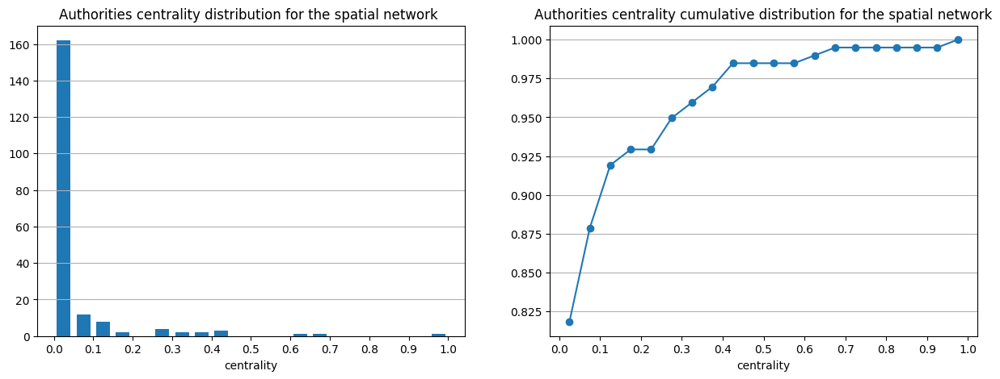

In [51]:
from utils.graphics import plot_spatial_network_centrality_distribution

plot_spatial_network_centrality_distribution(spatial_network_hits[0], 'hubs centrality')
plot_spatial_network_centrality_distribution(spatial_network_hits[1], 'authorities centrality')

## 02.2 Community Detection
The community detection algorithms aim to discover groups within the networks as part of our objective to reveal insights about the traffic flow structure. The results on the temporal graphs may help locate specific areas within the cities which display similar traffic behavior
during certain times of the day. Regarding the spatial network, the found communities should indicate structurally similar areas. As explained in the Dataset section we applied community detection on an undirected version of the temporal graphs.

In [52]:
# Build a directory to save the results
RESULTS_DIR = 'results'
os.makedirs(RESULTS_DIR, exist_ok=True)

The community detection is applied on an undirected version of the temporal network for complexity and algorithmic compatibility resons. The undirected version of the temporal network is built below and its characteristics are illustrated

In [53]:
undirected_temporal_networks_dict = {k: v.to_undirected() for k, v in temporal_networks_dict.items()}

In [54]:
for k, v in undirected_temporal_networks_dict.items():
   print(f'Undirected temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())}')

Undirected temporal network at time 0: nodes: 198 edges: 17381
Undirected temporal network at time 8: nodes: 198 edges: 18698
Undirected temporal network at time 13: nodes: 198 edges: 18676
Undirected temporal network at time 20: nodes: 198 edges: 18576


In [55]:
for k, v in undirected_temporal_networks_dict.items():
    print(f'Undirected temporal network at time {k} density: {nx.density(v)}')

Undirected temporal network at time 0 density: 0.8911962262216069
Undirected temporal network at time 8 density: 0.9587242988258217
Undirected temporal network at time 13 density: 0.9575962672409373
Undirected temporal network at time 20 density: 0.9524688509460083


### 02.2.1 Girvan-Newmann Strength ofWeak Ties algorithm
In this algorithm the edges with the highest weighted betweenness are gradually removed and the measure is recomputed after every removal until the network falls off to smaller components. In the temporal graph the obtained communities should consist in travel clusters which can
be connected through others by highly traffic-busy edges. In the spatial graph it should define densely connected areas which are highly distant from each other.

In [56]:
from time import time

In [57]:
from utils.metrics import get_girvan_newman_communities

start_time = time()
spatial_network_girvan_newman_communities = get_girvan_newman_communities(spatial_network, weight='weight', k=4, seed=42)
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 14.26 s


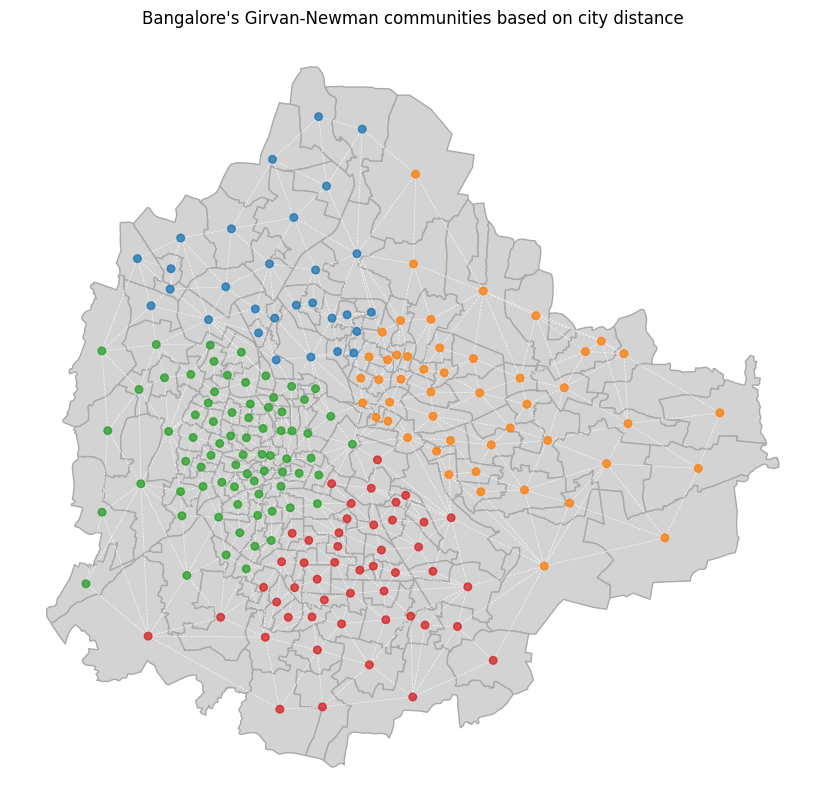

In [58]:
from utils.graphics import plot_communities

plot_communities(gdf, spatial_network, spatial_network_girvan_newman_communities,
                 title = f"{CITY_NAME}'s Girvan-Newman communities based on city distance")

In [59]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_girvan_newman_communities, f)

In [60]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-girvan-newman-spatial.pickle'), 'rb') as f:
    spatial_network_girvan_newman_communities = pickle.load(f)

### 02.2.4 Greedy Modularity Maximization

#### Spatial network

In [61]:
from utils.metrics import get_greedy_modularity_communities

start_time = time()
spatial_greedy_modularity_communities = get_greedy_modularity_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.05 s


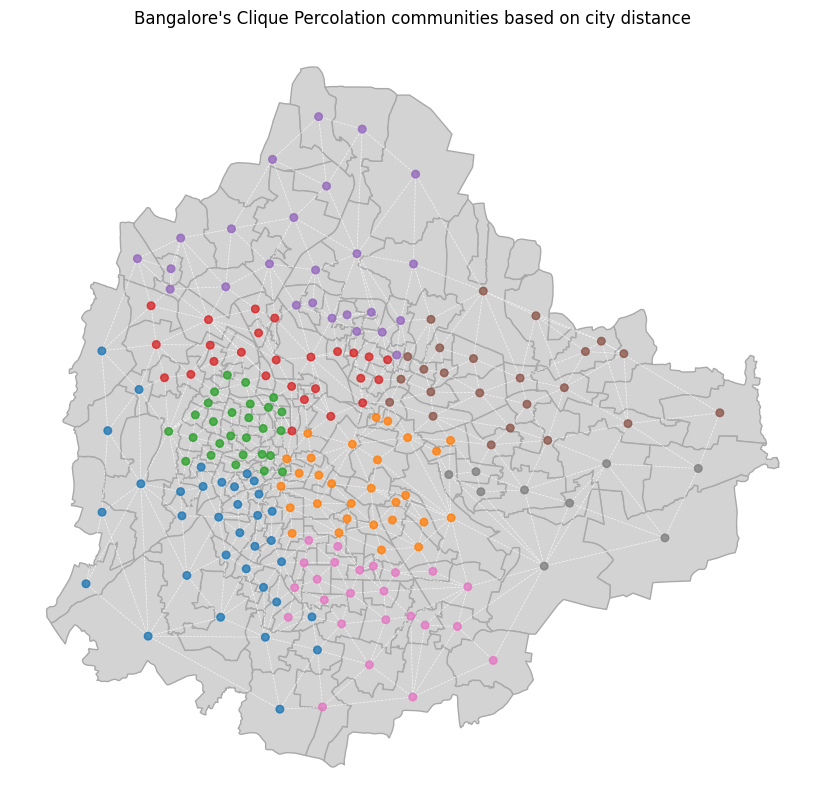

In [62]:
from utils.graphics import plot_communities

plot_communities(gdf, spatial_network, spatial_greedy_modularity_communities,
                 title = f"{CITY_NAME}'s Clique Percolation communities based on city distance")

#### Temporal network

In [63]:
from time import time

temporal_networks_greedy_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_greedy_communities[k] = get_greedy_modularity_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.67 s
Time for computing the temporal network communities at time 08:00: 0.85 s
Time for computing the temporal network communities at time 13:00: 0.67 s
Time for computing the temporal network communities at time 20:00: 0.86 s

Total for computing the temporal network communities at time 20:00: 3.05 s


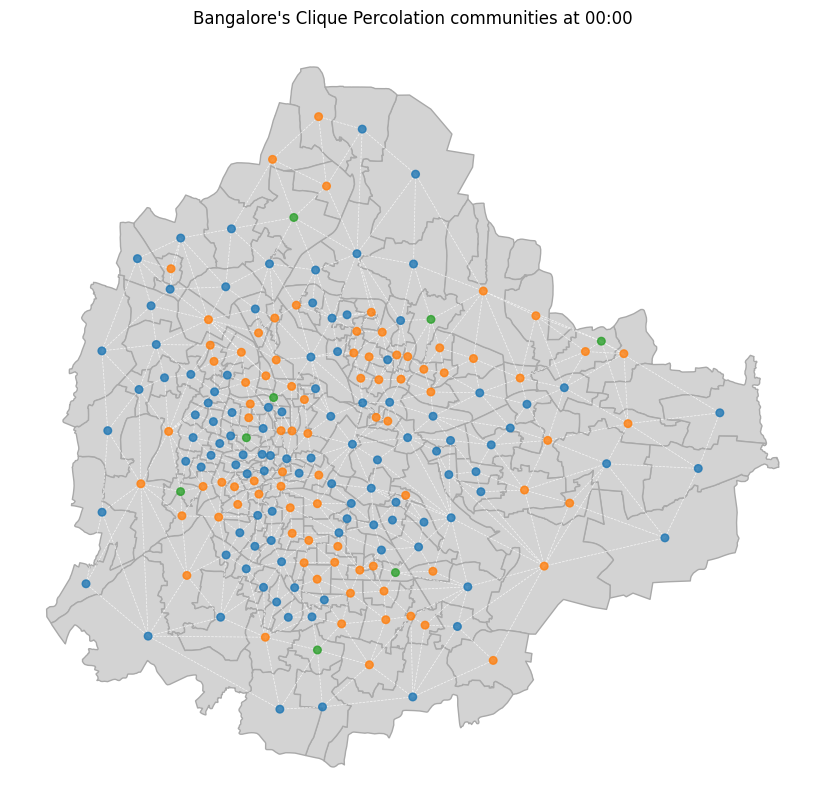

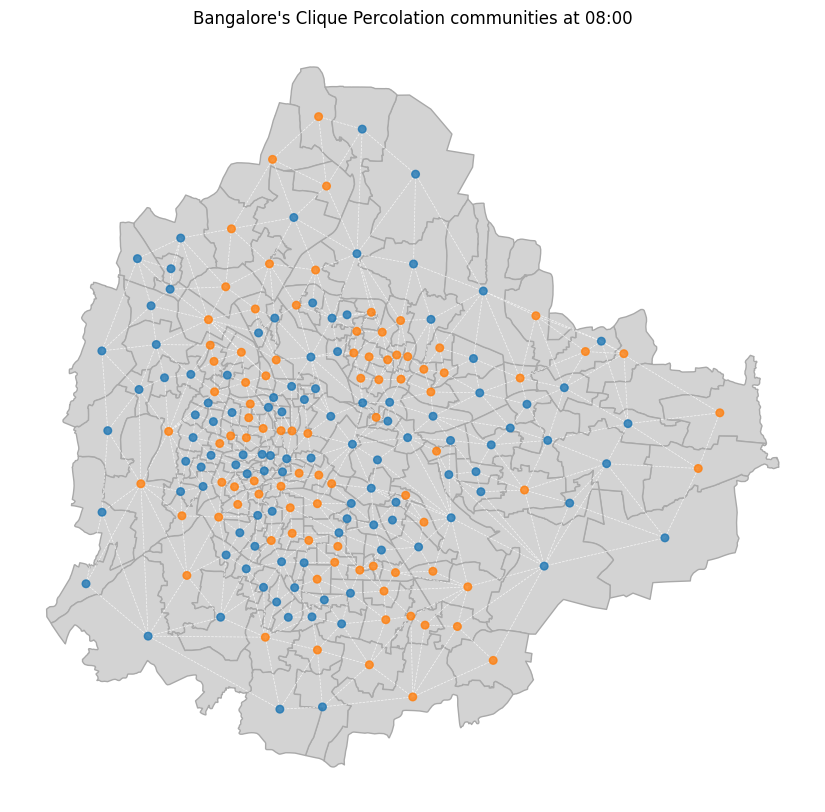

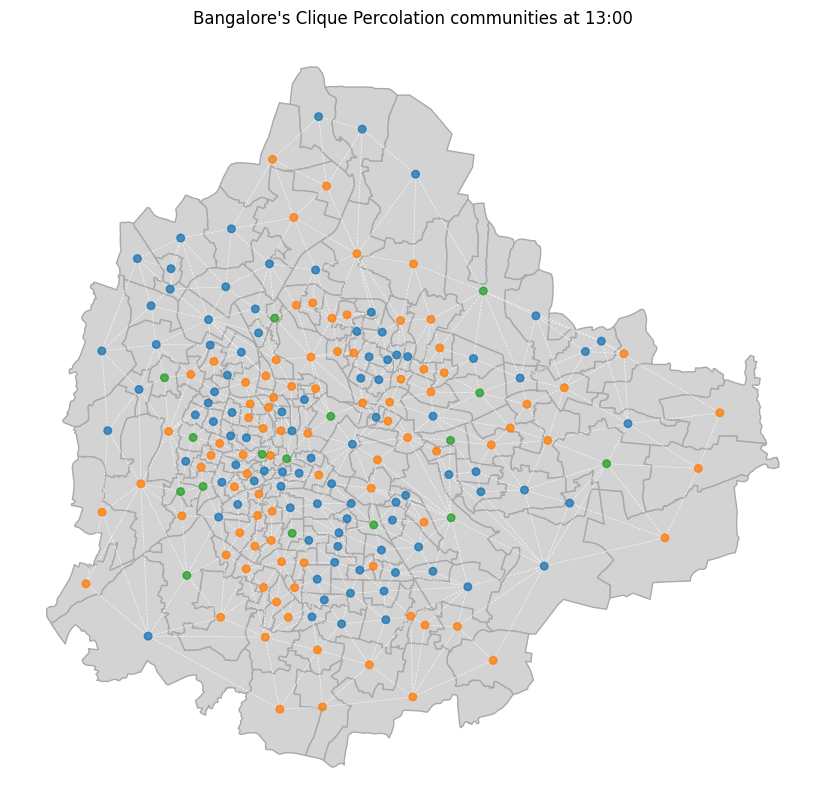

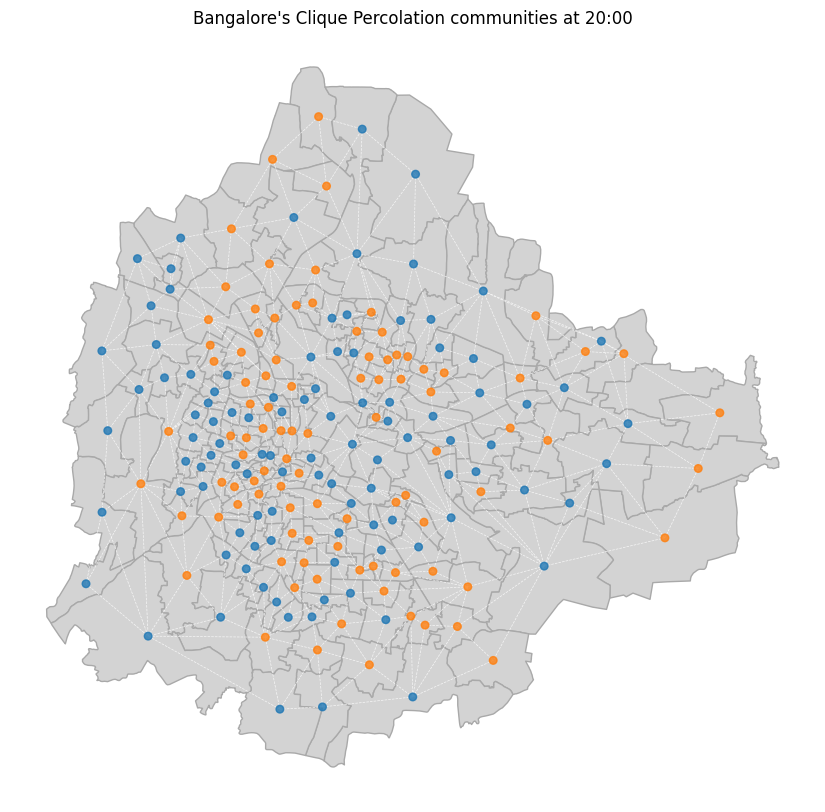

In [64]:
from utils.graphics import plot_communities

for k, v in temporal_networks_greedy_communities.items():
    plot_communities(gdf, spatial_network, v,
                     title=f"{CITY_NAME}'s Clique Percolation communities at {k:02d}:00")